In [2]:
%%html
<div style="background-color: #f0f0f5; padding: 20px; border-radius: 10px; text-align: center;">
    <h1 style="color: #3333cc;">Przygotowanie Danych</h1>
</div>

# Wstęp

## Import bibliotek

In [1]:
# Podstawowe biblioteki
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import os

### Zmiana automatycznych utawień wyświetlania tabel i zaokrągleń

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('float_format', '{:.2f}'.format)

## Wczytanie danych

**Źródło danych:** https://www.kaggle.com/c/home-credit-default-risk/data 

In [3]:
application = pd.read_csv("application_train.csv")
bureau = pd.read_csv("bureau.csv")
bureau_balance = pd.read_csv("bureau_balance.csv")
credit_card_balance = pd.read_csv("credit_card_balance.csv")
installments_payments = pd.read_csv("installments_payments.csv")
POS_CASH_balance = pd.read_csv("POS_CASH_balance.csv")
previous_application = pd.read_csv("previous_application.csv")

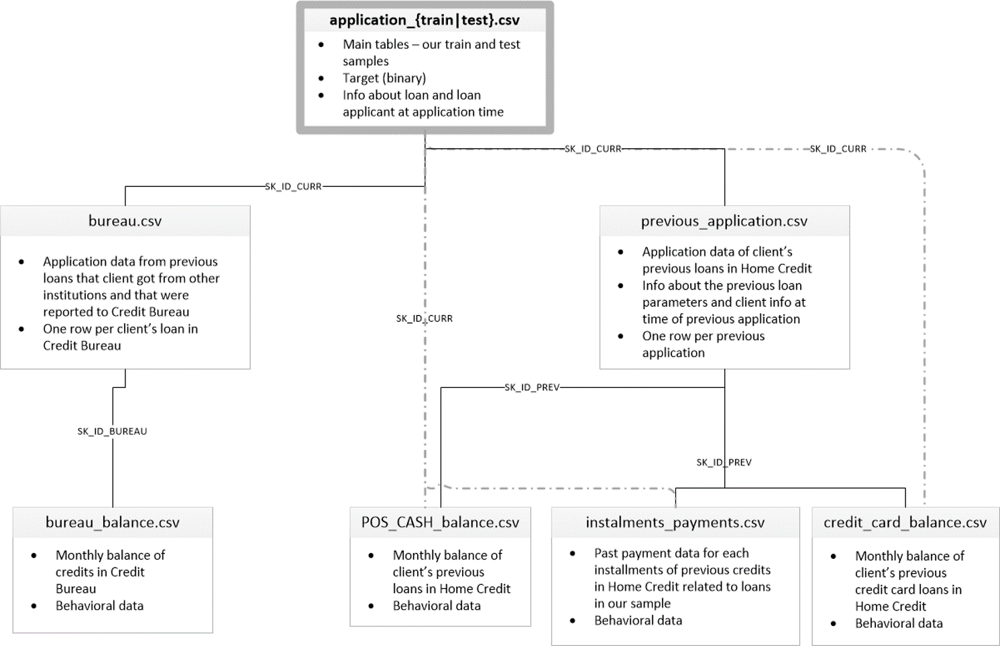

**Opis zbioru danych**

* łącznie dane pochodzą z 7 różnych plików, dostarczając informacji z różnych źródeł, więc są podstawą do zbudowania solidnego i dokładnego modelu scoringowego
* główną tabelą jest tabela z aplikacjami klientów
* do niej dołączone są informacje z biura informacji kredytowej (bureau), które zawierają szczegółowe dane na temat poprzednich pożyczek pożyczkobiorcy udzielonych przez inne banki
* dodatkowo dołączone są informacje o poprzednich aplikacjach wnioskodawców m.in. dotyczące pożyczek gotówkowych (pos_cash), spłacania rat oraz posiadanych kart kredytowych

<div class="alert alert-block alert-info"> <b>Uwaga: </b> Specyfikacja kolumn wszystkich 7 tabel wskazuje, że można je odpowiednio połączyć albo poziomo albo stosując odpowiednie agregaty.

## Sprawdzenie danych

### Rozmiar danych

In [4]:
print(f"Rozmiar tabeli application: {application.shape}")
print(f"Rozmiar tabeli bureau: {bureau.shape}")
print(f"Rozmiar tabeli bureau_balance: {bureau_balance.shape}")
print(f"Rozmiar tabeli previous_application: {previous_application.shape}")
print(f"Rozmiar tabeli POS_CASH_balance: {POS_CASH_balance.shape}")
print(f"Rozmiar tabeli installments_payments: {installments_payments.shape}")
print(f"Rozmiar tabeli credit_card_balance: {credit_card_balance.shape}")

Rozmiar tabeli application: (307511, 122)
Rozmiar tabeli bureau: (1716428, 17)
Rozmiar tabeli bureau_balance: (27299925, 3)
Rozmiar tabeli previous_application: (1670214, 37)
Rozmiar tabeli POS_CASH_balance: (10001358, 8)
Rozmiar tabeli installments_payments: (13605401, 8)
Rozmiar tabeli credit_card_balance: (3840312, 23)


In [5]:
application.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,-1134.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00


In [6]:
# Obliczenie liczby wystąpień zmiennej celu oraz jej procentowego udziału w zbiorze danych
value_counts = application['TARGET'].value_counts()
percentage = (application['TARGET'].value_counts() / len(application)) * 100

# Stworzenie DataFrame
summary_table = pd.DataFrame({
    'Value': value_counts.index,
    'Count': value_counts.values,
    'Percentage (%)': percentage.values
})

print(summary_table)

   Value   Count  Percentage (%)
0      0  282686           91.93
1      1   24825            8.07


<div class="alert alert-block alert-warning"> <b>Info:</b> Można powiedzieć, że 8% danych to przypadki, gdzie wystąpił default a 92% to pożyczki spłacane terminowo. Zbiór nie jest zbilansowany, jednak nad tym problemem pochylę się po etapie przygotowania i połączenia odpowiednich tabel.

In [7]:
bureau.head(1)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.00,-153.00,NaN,0,91323.00,0.00,NaN,0.00,Consumer credit,-131,NaN


In [8]:
bureau_balance.head(1)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C


In [9]:
previous_application.head(1)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,0.00,17145.00,SATURDAY,15,Y,1,0.00,0.18,0.87,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00


In [10]:
POS_CASH_balance.head(1)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.00,45.00,Active,0,0


In [11]:
installments_payments.head(1)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.00,6,-1180.00,-1187.00,6948.36,6948.36


In [12]:
credit_card_balance.head(1)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.97,135000,0.00,877.50,0.00,877.50,1700.33,1800.00,1800.00,0.00,0.00,0.00,0.00,1,0.00,1.00,35.00,Active,0,0


# Przygotowanie danych cz.I

## Tabela "application"

### Sprawdzenie podstawowych charakterystyk zbioru

In [13]:
application.shape

(307511, 122)

In [14]:
results = []

total_rows = len(application) #liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in application:
    unique_values = application[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = application[column].dtype  # Typ danych
    null_count = application[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = application[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif application[column].dtype == 'object':
        values_to_display = application[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,307511,> 5 unikatowych wartości liczbowych,0,0.00
1,TARGET,int64,2,"[1, 0]",0,0.00
2,NAME_CONTRACT_TYPE,object,2,"[Cash loans, Revolving loans]",0,0.00
3,CODE_GENDER,object,3,"[M, F, XNA]",0,0.00
4,FLAG_OWN_CAR,object,2,"[N, Y]",0,0.00
5,FLAG_OWN_REALTY,object,2,"[Y, N]",0,0.00
6,CNT_CHILDREN,int64,15,> 5 unikatowych wartości liczbowych,0,0.00
7,AMT_INCOME_TOTAL,float64,2548,> 5 unikatowych wartości liczbowych,0,0.00
8,AMT_CREDIT,float64,5603,> 5 unikatowych wartości liczbowych,0,0.00
9,AMT_ANNUITY,float64,13672,> 5 unikatowych wartości liczbowych,12,0.00


In [15]:
# statystyki dla zmiennych liczbowych
application.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.00,307511.00,307511.00,307511.00,307511.00,307499.00,307233.00,307511.00,307511.00,307511.00,307511.00,307511.00,104582.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307509.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,134133.00,306851.00,246546.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,159080.00,306490.00,306490.00,306490.00,306490.00,307510.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,265992.00,265992.00,265992.00,265992.00,265992.00,265992.00
mean,278180.52,0.08,0.42,168797.92,599026.00,27108.57,538396.21,0.02,-16037.00,63815.05,-4986.12,-2994.20,12.06,1.00,0.82,0.20,1.00,0.28,0.06,2.15,2.05,2.03,12.06,0.02,0.05,0.04,0.08,0.23,0.18,0.50,0.51,0.51,0.12,0.09,0.98,0.75,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.11,0.09,0.98,0.76,0.04,0.07,0.15,0.22,0.23,0.06,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.10,1.42,0.14,1.41,0.10,-962.86,0.00,0.71,0.00,0.02,0.09,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.27,0.27,1.90
std,102790.18,0.27,0.72,237123.15,402490.78,14493.74,369446.46,0.01,4363.99,141275.77,3522.89,1509.45,11.94,0.00,0.38,0.40,0.04,0.45,0.23,0.91,0.51,0.50,3.27,0.12,0.22,0.20,0.27,0.42,0.38,0.21,0.19,0.19,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.14,0.16,0.08,0.09,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.07,0.13,0.10,0.14,0.16,0.08,0.10,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.15,0.16,0.08,0.09,0.11,0.05,0.07,0.11,2.40,0.45,2.38,0.36,826.81,0.

### Obsługa braków danych

<div class="alert alert-block alert-warning"> <b>Info: </b>
<br> W skoringu kredytowym braki danych można traktować na wiele sposobów. Ogolnie rzecz biorąc zmienne, które będą miały bardzo niskie braki danych (do maks 5%) będą imputowane medianą lub średnią. Zmienne, które mają około 5-20% pozostawiam jako braki danych, ponieważ potem będzie można z nich stworzyć osobne kategorie w trakcie dyskretyzacji, a taki % może nieść cenne informacje. Zmienne, które będą osiągać więcej niż 30-40% braków raczej usunę ze zbioru, ponieważ nie będą one praktyczne w zastosowaniu. Co do zmiennych kategorycznych to będą one miały nadaną osobną kategorie jako brak danych.

* Po sprawdzeniu informacji, które niesie każda ze zmiennych posiadająca wartości puste (braki danych) dla więcej niż 40% przypadków, już w tym miejscu zdecydowano się je usunąć.
* Nie stwierdzono szczególnie ważnej istotności zmiennych z biznesowego punktu widzenia
* Dodatkowo usunięte braki danych same w sobie nie niosą żadnych wartosciowych informacji

#### Usunięcie niepotrzebnych zmiennych

In [16]:
application = application.loc[:,(application.isnull().sum() / len(application)) <= 0.4]

#### Braki danych dla kolumn z mniej niż 1%

In [ ]:
# Obliczenie procentowego udziału braków danych dla każdej kolumny
percent_missing = application.isna().mean() * 100

# Filtrowanie kolumn z mniej niż 1% braków danych
columns_with_less_than_1_percent_na = percent_missing[percent_missing < 1].index

# Uzupełnienie brakujących danych medianą dla tych kolumn
for col in columns_with_less_than_1_percent_na:
    if application[col].dtype in ['float64', 'int64']:  # Upewnienie, że kolumna jest typu numerycznego
        application[col].fillna(application[col].median(), inplace=True)

#### Braki danych dla kolumn kategorycznych 

In [ ]:
categorical_columns = application.select_dtypes(include=['object', 'category']).columns

# Uzupełnienie brakujących danych
application[categorical_columns] = application[categorical_columns].fillna('Brak Danych')

#### Braki danych dla kolumny EXT_SOURCE_3 - zbadanie tej zmiennej w celu imputacji

In [ ]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='TARGET', y='EXT_SOURCE_3', data=application)
plt.title('Rozkład zmiennej EXT_SOURCE_3 w zależności od TARGET')
plt.xlabel('TARGET')
plt.ylabel('EXT_SOURCE_3')
plt.show()

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Można powiedzieć, że zmienna ta wskazuje na dość dobre rozróżnienie między defaultem i jego brakiem 
<br> * W związku z tym, pozostawiam ją w zbiorze danych i nie imputuje

#### Braki danych dla pozostałych kolumn z oryginalnej tabeli application

In [ ]:
# kolumny: AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR

In [ ]:
columns_to_analyze = ['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
                      'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']

# Wykresy pudełkowe dla każdej z kolumn
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))
axes = axes.flatten()  # Spłaszczenie tablicy osi, aby łatwiej nimi zarządzać

for i, col in enumerate(columns_to_analyze):
    sns.boxplot(x='TARGET', y=col, data=application, ax=axes[i])
    axes[i].set_title(f'Boxplot of {col} by TARGET')
    axes[i].set_xlabel('TARGET')
    axes[i].set_ylabel(col)

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Można powiedzieć, dla każdej z tych zmienncyh rozkład z reguły przyjmuje wartości bliskie zeru z pojedynczymi outlierami 
<br> * Jedyną zmienną która nie ma samych outlierów jest AMT_REQ_CREDIT_BUREAU_YEAR, która oznacza liczbę zapytań do BIK o klineta na rok przed złożeniem wniosku
<br> * W związku z tym pozostałe 5 zmiennych usunę ze zbioru a zmienną roczną pozostawię z brakami, jak w przypadku EXT_SOURCE_3

In [ ]:
columns_to_drop = ['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT']

# Usunięcie wybranych kolumn z DataFrame
application = application.drop(columns=columns_to_drop)

#### Sprawdzenie tabeli po obsłudze braków danych

In [ ]:
application.shape # pozostało 68 kolumn (zmiennych)

In [ ]:
results = []

total_rows = len(application) #liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in application:
    unique_values = application[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = application[column].dtype  # Typ danych
    null_count = application[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = application[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif application[column].dtype == 'object':
        values_to_display = application[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> Po wstępnej selekcji zmiennych pod względem braków danych pozostało 68 kolumn. Dwie z nich mają zostawione braki danych.

## Tabela "bureau_balance"

### Sprawdzenie podstawowych charakterystyk zbioru

In [ ]:
bureau_balance.shape

In [ ]:
results = []

total_rows = len(bureau_balance) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in bureau_balance:
    unique_values = bureau_balance[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = bureau_balance[column].dtype  # Typ danych
    null_count = bureau_balance[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = bureau_balance[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif bureau_balance[column].dtype == 'object':
        values_to_display = bureau_balance[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

In [ ]:
# Statystyki dla zmiennych liczbowych
bureau_balance.describe()

### Obsługa braków danych

* Nie występują żadne braki danych w tabeli źródłowej "bureau_balance"

### Feature Engineering

Dane z tabeli bureau_balance przedstawiają statusy transakcji w zależności od miesięy bilansowych. Żeby tą tabelę połączyć z tabelą "bureau" należy zagregować dane do poziomu SK_ID_BUREAU. Dane można byłoby połączyć również poziomo, jednak nie ma to sensu ponieważ wtedy liczba wierszy znacząco by wzrosła i zawierała bardzo dużo wartości pustych dla kolumn. Agregacja jest tutaj najelpszym wyborem.

In [ ]:
# W zbiorze danych bureau_balance mamy 3 zmienne: id, miesiąc bilansowy oraz status w danym miesiącu
# Z punktu widzenia scoringu najważniejszy jest status, w związku z tym zdecydowałem się stworzyć zmienną, która będzie zliczać liczbę przypadków każdego statusu
# Dodatkowo przedstawiony został najwcześniejszy i najpóźniejszy miesiąc salda w stosunku do daty złożenia wniosku 

# Agregacja MONTHS_BALANCE do znalezienia najwcześniejszego i najnowszego miesiąca dla każdego SK_ID_BUREAU
agg_bureau_balance = bureau_balance.groupby('SK_ID_BUREAU').agg(
    EARLIEST_MONTHS_BALANCE=('MONTHS_BALANCE', 'min'),
    LATEST_MONTHS_BALANCE=('MONTHS_BALANCE', 'max')
).reset_index()

# Liczenie wystąpień każdego statusu
status_counts = bureau_balance.pivot_table(index='SK_ID_BUREAU', columns='STATUS', aggfunc='size', fill_value=0)

# Dodawanie nazwy powstałych zmiennych statusowych z przodu: 'Status_Bureau_Balance_'
status_counts.columns = ['STATUS_' + str(col) for col in status_counts.columns]

# Łączenie agregatów z liczeniem statusów
bureau_balance_agg = pd.merge(agg_bureau_balance, status_counts, on='SK_ID_BUREAU', how='left')

In [ ]:
# Dodanie do każdej kolumny przed nazwą skrótu BUREAU_BALANCE, żeby było wiadomo że te kolumny pochodzą z tabeli bureau_balance
bureau_balance_agg.columns = ['BUREAU_BALANCE_' + col if col != 'SK_ID_BUREAU' else col for col in bureau_balance_agg.columns] #zostawienie oryginalne nazwy klucza glównego

In [ ]:
bureau_balance_agg.head(3)

Tak przygotowaną tabelę w dalszej części będzie można połączyć ze zbiorem "bureau".

## Tabela "bureau"

### Sprawdzenie podstawowych charakterystyk zbioru

In [ ]:
bureau.shape

In [ ]:
results = []

total_rows = len(bureau) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in bureau:
    unique_values = bureau[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = bureau[column].dtype  # Typ danych
    null_count = bureau[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = bureau[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif bureau[column].dtype == 'object':
        values_to_display = bureau[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

In [ ]:
# Statystyki dla zmiennych liczbowych
bureau.describe()

### Obsługa braków danych

<div class="alert alert-block alert-warning"> <b>Info: </b>  W zbiorze bureau zdecydowano się na usunięcie zmiennych, które mają powyżej 40% braków danych - 2 zmienne

#### Usunięcie niepotrzebnych zmiennych

In [ ]:
bureau = bureau.loc[:,(bureau.isnull().sum() / len(bureau)) <= 0.4]

#### Sprawdzenie tabeli po obsłudze braków danych

In [ ]:
bureau.shape

In [ ]:
results = []

total_rows = len(bureau) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in bureau:
    unique_values = bureau[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = bureau[column].dtype  # Typ danych
    null_count = bureau[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = bureau[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif bureau[column].dtype == 'object':
        values_to_display = bureau[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

<div class="alert alert-block alert-warning"> <b>Info: </b>  Pozostały 2 zmienne z brakami danych: DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT. Nie będą one natomiast obsłużone w tym miejscu, ponieważ dane z tej tabeli i tak będą agregowane do poziomu tabeli "application".

Feature Engineering dla tej tabeli zostanie przeprowadzony po dołączeniu do niej danych z bureau_balance -> poniżej.

## Połączenie tabel "bureau_balance" i "bureau"

In [ ]:
# Przed połaczeniem do tabeli Bureau dodanie skrótu do każdej zmiennej, żeby było wiadomo, że to jest Bureau
bureau.columns = ['BUREAU_' + col if col not in ('SK_ID_BUREAU', 'SK_ID_CURR') else col for col in bureau.columns] #zostawienie oryginalne nazwy klucza glównego

In [ ]:
df_bik =  pd.merge(bureau, bureau_balance_agg, on='SK_ID_BUREAU', how='left')
df_bik.head()

W wyniku połączenia obu tych zbiorów dla zagregowanych danych często wystepują braki danych, mogłyby one zostać uzupełnione w tym miejscu natomiast nie ma to sensu, ponieważ tutaj są one do pojedyczych wpisów w BIK, a i tak w dalszej części dane z BIK będą agregowane do osób wnioskujących, czyli SK_ID_CURR.

## Tabela "df_bik"

### Feature Engineering 

In [ ]:
# Agregacja danych numerycznych
agg_functions = {
    'BUREAU_DAYS_CREDIT': ['mean', 'max', 'min'], # Ile dni przed bieżącym złożeniem wniosku klient złożył wniosek w BIK
    'BUREAU_CREDIT_DAY_OVERDUE': ['mean', 'sum', 'max'], # Liczba dni przeterminowania kredytu w momencie składania wniosku o powiązaną pożyczkę
    'BUREAU_DAYS_CREDIT_ENDDATE': ['mean', 'max', 'min'], # Pozostały czas trwania kredytu
    'BUREAU_DAYS_ENDDATE_FACT': ['mean', 'max', 'min'], # Dni od zakończenia kredytu do wniosku, dotyczy tylko zakończonych kredytów (dlatego tyle braków, ale zostawiam)
    'BUREAU_CNT_CREDIT_PROLONG': ['mean','sum'], # Ile razy był przedłużany kredyt w BIK
    'BUREAU_AMT_CREDIT_SUM': ['mean', 'sum'], # Aktualna kwota kredytu w BIK
    'BUREAU_AMT_CREDIT_SUM_DEBT': ['mean', 'sum'], # Aktualne zadłużenie na kredycie w BIK
    'BUREAU_AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'], # Aktualny limit kredytowy zgłoszony w BIK
    'BUREAU_AMT_CREDIT_SUM_OVERDUE': ['mean', 'sum'], # Aktualna kwota zaległości w BIK
    'BUREAU_DAYS_CREDIT_UPDATE': ['max', 'min'] # Ile dni przed złożeniem wniosku pojawiła się ostatnia informacja o kredycie w BIK
}

# Agregacja danych z df_bik
df_bik_agg = df_bik.groupby('SK_ID_CURR').agg(agg_functions)
df_bik_agg.columns = ['_'.join(col).upper() for col in df_bik_agg.columns.values] #dodanie nazw kolumn 
df_bik_agg.reset_index(inplace=True)


# Agregacja dla CREDIT_ACTIVE poprzez mode, czyli najczęściej występowany status
most_frequent_credit_active = df_bik.groupby('SK_ID_CURR')['BUREAU_CREDIT_ACTIVE'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'UNKNOWN').reset_index(name='BUREAU_MOST_FREQ_CREDIT_ACTIVE')

# Agregacja dla CREDIT_CURRENCY również poprzez mode, czyli najczęściej występująca waluta kredytu w BIK
most_frequent_credit_currency = df_bik.groupby('SK_ID_CURR')['BUREAU_CREDIT_CURRENCY'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'UNKNOWN').reset_index(name='BUREAU_MOST_FREQ_CREDIT_CURRENCY')

# Agregacja dla CREDIT_TYPE również poprzez mode, czyli najczęściej występujący rodzaj kredytu w BIK
most_frequent_credit_type = df_bik.groupby('SK_ID_CURR')['BUREAU_CREDIT_TYPE'].agg(
    lambda x: x.mode()[0] if not x.mode().empty else 'UNKNOWN').reset_index(name='BUREAU_MOST_FREQ_CREDIT_TYPE')

# Najwcześniejszy i najpóźniejszy MONTHS_BALANCE
earliest_months_balance = df_bik.groupby('SK_ID_CURR')['BUREAU_BALANCE_EARLIEST_MONTHS_BALANCE'].min().reset_index(name='BUREAU_BALANCE_EARLIEST_MONTHS_BALANCE')
latest_months_balance = df_bik.groupby('SK_ID_CURR')['BUREAU_BALANCE_LATEST_MONTHS_BALANCE'].max().reset_index(name='BUREAU_BALANCE_LATEST_MONTHS_BALANCE')

# Agregacja kolumn ze statusem bilansu, który wcześniej agregowałem do bureau z bureau_balance
status_columns = ['BUREAU_BALANCE_STATUS_0', 'BUREAU_BALANCE_STATUS_1', 'BUREAU_BALANCE_STATUS_2', 'BUREAU_BALANCE_STATUS_3', 'BUREAU_BALANCE_STATUS_4', 'BUREAU_BALANCE_STATUS_5', 'BUREAU_BALANCE_STATUS_C', 'BUREAU_BALANCE_STATUS_X']
status_sums = df_bik.groupby('SK_ID_CURR')[status_columns].sum().reset_index()


# Łączenie wszystkich zagregowanych wyników do df_bik_final 
df_bik_final = df_bik_agg.merge(most_frequent_credit_active, on='SK_ID_CURR', how='left')\
    .merge(most_frequent_credit_currency, on='SK_ID_CURR', how='left')\
    .merge(most_frequent_credit_type, on='SK_ID_CURR', how='left')\
    .merge(earliest_months_balance, on='SK_ID_CURR', how='left')\
    .merge(latest_months_balance, on='SK_ID_CURR', how='left')\
    .merge(status_sums, on='SK_ID_CURR', how='left')

### Sprawdzenie danych po agregacji

In [ ]:
df_bik_final.shape

In [ ]:
results = []

total_rows = len(df_bik_final) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_bik_final:
    unique_values = df_bik_final[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_bik_final[column].dtype  # Typ danych
    null_count = df_bik_final[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_bik_final[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_bik_final[column].dtype == 'object':
        values_to_display = df_bik_final[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

<div class="alert alert-block alert-warning"> <b>Info: </b>Dane zawierają praktycznie taką samą liczbę wierszy co tabela application, czyli grupowanie przebiegło pomyślnie. Dla każdego wniosku mamy zagregowane najróżniejsze dane z BIK

### Obsługa braków danych

In [ ]:
# Decyduję się na usunięcie braków danych, tam gdzie jest więcej niż 40% czyli dwie nowo dodane zmienne EARLIEST_MONTHS_BALANCE i 'LATEST_MONTHS_BALANCE'
df_bik_final = df_bik_final.loc[:,(df_bik_final.isnull().sum() / len(df_bik_final)) <= 0.4]

In [ ]:
# Mamy 4 kolumny, gdzie % nulli jest < 1%. W takim wypadku decyduje się na imputacje medianą
columns_to_fill = ['BUREAU_DAYS_CREDIT_ENDDATE_MEAN', 'BUREAU_DAYS_CREDIT_ENDDATE_MAX', 'BUREAU_DAYS_CREDIT_ENDDATE_MIN', 'BUREAU_AMT_CREDIT_SUM_MEAN', 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN']

for column in columns_to_fill:
    median_value = df_bik_final[column].median()
    df_bik_final[column].fillna(median_value, inplace=True)

In [ ]:
# Decyduje się również usunąć zmienne, gdzie braki danych są powyżej 5% (nie możemy dać takich zmiennych, bo potem będę robił left joina z tabelą application i braki danych nie mogą w tym momencie występować, będą mogły po połączeniu z tabelą i niosą wtedy informacje, że nie ma ich w danej tabeli)
df_bik_final = df_bik_final.loc[:,(df_bik_final.isnull().sum() / len(df_bik_final)) <= 0.05]

### Sprawdzenie zagregowanej tabeli po zmianach

In [ ]:
# tabela df_bik_final ma ostatecznie 32 kolumny i 305811 wierszy
df_bik_final.shape

In [ ]:
results = []

total_rows = len(df_bik_final) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_bik_final:
    unique_values = df_bik_final[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_bik_final[column].dtype  # Typ danych
    null_count = df_bik_final[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_bik_final[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_bik_final[column].dtype == 'object':
        values_to_display = df_bik_final[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

Taka tabela jest gotowa do połączenia jej w dalszym etapie z tabelą "application".

## Tabela "previous_application"

### Sprawdzenie podstawowych charakterystyk zbioru

In [ ]:
previous_application.shape

In [ ]:
results = []

total_rows = len(previous_application) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in previous_application:
    unique_values = previous_application[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = previous_application[column].dtype  # Typ danych
    null_count = previous_application[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = previous_application[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif previous_application[column].dtype == 'object':
        values_to_display = previous_application[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

In [ ]:
# Statystyki dla zmiennych liczbowych
previous_application.describe()

### Obsługa braków danych

<div class="alert alert-block alert-warning"> <b>Info: </b>  W zbiorze z poprzednimi aplikacjami 'previous_application' znajduje się 11 zmiennych, które mają powyżej 40% braków danych i te zmienne zdecydowano się usunąć już na tym etapie

#### Usunięcie niepotrzebnych zmiennych

In [ ]:
previous_application = previous_application.loc[:,(previous_application.isnull().sum() / len(previous_application)) <= 0.4]

In [ ]:
previous_application.shape

Pozostało 5 zmiennych z brakami danych. Na tym etapie nie będę ich obsługiwał, ponieważ zaraz i tak dane z tej tabeli będą agregowane do poziomu SK_ID_CURR, czyli tabeli aplikacyjnej, więc może braki nie będą stanowić problemu, a zmienne te wydają się na tyle ważne, żeby nie ingerować w ich wartości.

### Feature Engineering

In [ ]:
# Przed połaczeniem do tabeli installments_payments dodanie skrótu do każdej zmiennej
previous_application.columns = ['PREVIOUS_APPLICATION_' + col if col not in ('SK_ID_PREV', 'SK_ID_CURR') else col for col in previous_application.columns] #zostawienie oryginalne nazwy klucza glównego

In [53]:
# Nowa zmienna: stosunek AMT_APPLICATION do AMT_CREDIT (czyli stosunek wnioskowanej kwoty do otrzymanej - duży stosunek może świadczyć o słabszych klientach?)
previous_application['PREVIOUS_APPLICATION_RATIO_APP_TO_GET'] = previous_application['PREVIOUS_APPLICATION_AMT_APPLICATION'] / previous_application['PREVIOUS_APPLICATION_AMT_CREDIT']
previous_application['PREVIOUS_APPLICATION_RATIO_APP_TO_GET'].replace([np.inf, -np.inf], np.nan, inplace=True)
previous_application['PREVIOUS_APPLICATION_RATIO_APP_TO_GET'].fillna(0, inplace=True)

agg_functions = {
    'PREVIOUS_APPLICATION_AMT_ANNUITY': ['mean', 'max', 'min', 'sum'],
    'PREVIOUS_APPLICATION_AMT_APPLICATION': ['mean', 'max', 'min', 'sum'], # O ile klient prosił
    'PREVIOUS_APPLICATION_AMT_CREDIT': ['mean', 'max', 'min', 'sum'],  # Ile uzyskał
    'PREVIOUS_APPLICATION_AMT_GOODS_PRICE': ['mean', 'max', 'min', 'sum'],  # Cena towaru o ktory wnioskował
    'PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START': ['mean', 'min','max'], # Godzina o której zaczął się proces
    'PREVIOUS_APPLICATION_DAYS_DECISION': ['mean', 'max', 'min', 'sum'], # Jak dawno temu była podjęta decyzja
    'PREVIOUS_APPLICATION_RATIO_APP_TO_GET': ['mean', 'max', 'min']
}

# Agregacja danych
df_previous_application_agg = previous_application.groupby('SK_ID_CURR').agg(agg_functions)
df_previous_application_agg.columns = ['_'.join(col).upper() for col in df_previous_application_agg.columns.values]
# Resetowanie indeksu
df_previous_application_agg.reset_index(inplace=True)


# Nowa zmienna: zliczanie liczby poprzednich aplikacji dla każdego klienta
df_previous_application_agg['PREVIOUS_APPLICATION_PREV_APPS_COUNT'] = previous_application.groupby('SK_ID_CURR')['SK_ID_PREV'].transform('size')

In [54]:
# Stworzenie zmiennych dummy, czyli np. mamy kolor który ma 3 warianty to tworzę 3 zmienne 0-1 czy dany rekord miał taki kolor czy nie, 1 rekord będzie miały tylko jedną jedynek w tych trzech zmiennych (przydatne do zmienny, gdzie występuje niewiele wariantów)
categorical_columns_dummy = [
    'PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE',  # Ile dany klient miał jakich umów
    'PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START',  # Ile dany klient miał wniosków w jakie dni tygodnia
    'PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS',  # Ile dany klient miał jakich statsów umowy
    'PREVIOUS_APPLICATION_NAME_CLIENT_TYPE',  # Ile dany klient był ponownie
    'PREVIOUS_APPLICATION_CODE_REJECT_REASON',  # Dlaczego poprzedni wniosek został odrzucony
    'PREVIOUS_APPLICATION_NAME_PRODUCT_TYPE',  # Ile jaki produkt type
    'PREVIOUS_APPLICATION_NAME_YIELD_GROUP'
]

# Stworzenie zmiennych dummy i ich agregacja
for cat_col in categorical_columns_dummy:
    dummies = pd.get_dummies(previous_application[cat_col], prefix=cat_col)
    dummies_agg = dummies.groupby(previous_application['SK_ID_CURR']).agg('sum')
    if 'df_previous_application_agg' not in locals():
        df_previous_application_agg = dummies_agg
    else:
        df_previous_application_agg = df_previous_application_agg.join(dummies_agg, on='SK_ID_CURR', how='left')

In [56]:
# Agregacja najczęściej występujących wartości
most_frequent_features = [
    'PREVIOUS_APPLICATION_NAME_CASH_LOAN_PURPOSE', 
    'PREVIOUS_APPLICATION_NAME_PAYMENT_TYPE', 
    'PREVIOUS_APPLICATION_NAME_GOODS_CATEGORY', 
    'PREVIOUS_APPLICATION_CHANNEL_TYPE', 
    'PREVIOUS_APPLICATION_PRODUCT_COMBINATION'
]
for feature in most_frequent_features:
    mode_df = previous_application.groupby('SK_ID_CURR')[feature].agg(
        lambda x: x.mode()[0] if not x.mode().empty else 'UNKNOWN'
    ).reset_index(name=f'PREVIOUS_APPLICATION_MOST_FREQ_{feature}')
    df_previous_application_agg = df_previous_application_agg.merge(mode_df, on='SK_ID_CURR', how='left')

In [57]:
# Nazwy kolumn drukowane
df_previous_application_agg.columns = [col.upper() for col in df_previous_application_agg.columns]

### Sprawdzenie zagregowanej tabeli previous_application po zmianach

In [58]:
results = []

total_rows = len(df_previous_application_agg) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_previous_application_agg:
    unique_values = df_previous_application_agg[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_previous_application_agg[column].dtype  # Typ danych
    null_count = df_previous_application_agg[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_previous_application_agg[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_previous_application_agg[column].dtype == 'object':
        values_to_display = df_previous_application_agg[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,338857,> 5 unikatowych wartości liczbowych,0,0.00
1,PREVIOUS_APPLICATION_AMT_ANNUITY_MEAN,float64,311139,> 5 unikatowych wartości liczbowych,480,0.14
2,PREVIOUS_APPLICATION_AMT_ANNUITY_MAX,float64,164390,> 5 unikatowych wartości liczbowych,480,0.14
3,PREVIOUS_APPLICATION_AMT_ANNUITY_MIN,float64,159918,> 5 unikatowych wartości liczbowych,480,0.14
4,PREVIOUS_APPLICATION_AMT_ANNUITY_SUM,float64,310963,> 5 unikatowych wartości liczbowych,0,0.00
5,PREVIOUS_APPLICATION_AMT_APPLICATION_MEAN,float64,218595,> 5 unikatowych wartości liczbowych,0,0.00
6,PREVIOUS_APPLICATION_AMT_APPLICATION_MAX,float64,53054,> 5 unikatowych wartości liczbowych,0,0.00
7,PREVIOUS_APPLICATION_AMT_APPLICATION_MIN,float64,39315,> 5 unikatowych wartości liczbowych,0,0.00
8,PREVIOUS_APPLICATION_AMT_APPLICATION_SUM,float64,198222,> 5 unikatowych wartości liczbowych,0,0.00
9,PREVIOUS_APPLICATION_AMT_CREDIT_MEAN,float64,239733,> 5 unikatowych wartości liczbowych,0,0.00


### Obsługa braków danych po agregacji 

<div class="alert alert-block alert-warning"> <b>Info: </b> Brak danych występuje dla 6 kolumn ale braki te są bardzo niewielkie. Stąd zostaną zastąpione medianami.

In [59]:
# Zastąpienie braków danych medianami
median_1 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MEAN'].median()
median_2 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MAX'].median()
median_3 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MIN'].median()
median_4 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MEAN'].median()
median_5 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MAX'].median()
median_6 = df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MIN'].median()

df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MEAN'].fillna(median_1, inplace=True)
df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MAX'].fillna(median_2, inplace=True)
df_previous_application_agg['PREVIOUS_APPLICATION_AMT_ANNUITY_MIN'].fillna(median_3, inplace=True)
df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MEAN'].fillna(median_4, inplace=True)
df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MAX'].fillna(median_5, inplace=True)
df_previous_application_agg['PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MIN'].fillna(median_6, inplace=True)

In [60]:
# Sprawdzenie usunięcie braków danych: False -> brak jakichkolwiek braków danych
df_previous_application_agg.isnull().any().any()

False

## Tabela "POS_CASH_balance"

### Sprawdzenie podstawowych charakterystyk zbioru

In [61]:
POS_CASH_balance.shape

(10001358, 8)

In [62]:
results = []

total_rows = len(POS_CASH_balance) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in POS_CASH_balance:
    unique_values = POS_CASH_balance[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = POS_CASH_balance[column].dtype  # Typ danych
    null_count = POS_CASH_balance[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = POS_CASH_balance[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif POS_CASH_balance[column].dtype == 'object':
        values_to_display = POS_CASH_balance[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_PREV,int64,936325,> 5 unikatowych wartości liczbowych,0,0.00
1,SK_ID_CURR,int64,337252,> 5 unikatowych wartości liczbowych,0,0.00
2,MONTHS_BALANCE,int64,96,> 5 unikatowych wartości liczbowych,0,0.00
3,CNT_INSTALMENT,float64,73,> 5 unikatowych wartości liczbowych,26071,0.26
4,CNT_INSTALMENT_FUTURE,float64,79,> 5 unikatowych wartości liczbowych,26087,0.26
5,NAME_CONTRACT_STATUS,object,9,"[Active, Completed, Signed, Approved, Returned to the store, Demand, Canceled, XNA, Amortized debt]",0,0.00
6,SK_DPD,int64,3400,> 5 unikatowych wartości liczbowych,0,0.00
7,SK_DPD_DEF,int64,2307,> 5 unikatowych wartości liczbowych,0,0.00


In [63]:
# Statystyki dla zmiennych liczbowych
POS_CASH_balance.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,10001358.00,10001358.00,10001358.00,9975287.00,9975271.00,10001358.00,10001358.00
mean,1903216.60,278403.86,-35.01,17.09,10.48,11.61,0.65
std,535846.53,102763.75,26.07,12.00,11.11,132.71,32.76
min,1000001.00,100001.00,-96.00,1.00,0.00,0.00,0.00
25%,1434405.00,189550.00,-54.00,10.00,3.00,0.00,0.00
50%,1896565.00,278654.00,-28.00,12.00,7.00,0.00,0.00
75%,2368963.00,367429.00,-13.00,24.00,14.00,0.00,0.00
max,2843499.00,456255.00,-1.00,92.00,85.00,4231.00,3595.00


<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Można zaobserwować braki danych dla dwóch kolumn: CNT_INSTALMENT (liczba rat kredtu) oraz CNT_INSTALMENT_FUTURE(liczba rat pozostałych do spłaty).
<br> * Braki danych zostaną sprawdzone dopiero po agregacji tej tabeli do poziomu SK_ID_CURR

### Feature Engineering

In [64]:
# Przed połaczeniem do tabeli POS_CASH dodanie skrótu do każdej zmiennej
POS_CASH_balance.columns = ['POS_CASH_' + col if col not in ('SK_ID_PREV', 'SK_ID_CURR') else col for col in POS_CASH_balance.columns] #zostawienie oryginalne nazwy klucza glównego

In [65]:
# Agregacja danych numerycznych
agg_functions = {
    'POS_CASH_MONTHS_BALANCE': ['min', 'max', 'mean'],  # Najwcześniejszy, najpóźniejszy i średni miesiąc salda
    'POS_CASH_CNT_INSTALMENT': ['mean', 'sum', 'max', 'min'],  # Średnia, suma, maksimum i minimum liczby rat
    'POS_CASH_CNT_INSTALMENT_FUTURE': ['mean', 'sum', 'max', 'min'],  # Średnia, suma, maksimum i minimum przyszłych rat
    'POS_CASH_SK_DPD': ['max', 'mean'],  # Maksymalne i średnie dni opóźnienia (z biznesowego punktu widzenia nie ma sensu minimum)
    'POS_CASH_SK_DPD_DEF': ['max', 'mean']  # Maksymalne i średnie dni opóźnienia po zastosowaniu ulg (z biznesowego punktu widzenia nie ma sensu minimum)
}

# Agregacja danych
df_POS_CASH_agg = POS_CASH_balance.groupby('SK_ID_CURR').agg(agg_functions)
df_POS_CASH_agg.columns = ['_'.join(col).upper() for col in df_POS_CASH_agg.columns.values] #dodanie nazw kolumn 
df_POS_CASH_agg.reset_index(inplace=True)

# Agregacja dla NAME_CONTRACT_STATUS, liczenie wystąpień każdego statusu
status_counts = POS_CASH_balance.pivot_table(index='SK_ID_CURR', columns='POS_CASH_NAME_CONTRACT_STATUS', aggfunc='size', fill_value=0)

# Dodawanie nazwy powstałych zmiennych statusowych z przodu: 'Status_Bureau_Balance_'
status_counts.columns = ['POS_CASH_NAME_CONTRACT_STATUS_' + str(col) for col in status_counts.columns]

# Dodatkowa zmienna: Liczenie liczby unikalnych wpisów POS_CASH dla każdego klienta (SK_ID_CURR) - czyli sprawdzenie ile jest unikalnych SK_ID_PREV dla każdego SK_ID_CURR
POS_CASH_APPLICATION_COUNT = POS_CASH_balance.groupby('SK_ID_CURR').agg(POS_CASH_APP_COUNT=('SK_ID_PREV', 'nunique')).reset_index()

# Łączenie agregatów z liczeniem statusów
df_POS_CASH_agg = pd.merge(df_POS_CASH_agg, status_counts, on='SK_ID_CURR', how='left')
df_POS_CASH_agg = pd.merge(df_POS_CASH_agg, POS_CASH_APPLICATION_COUNT, on='SK_ID_CURR', how='left')

In [66]:
df_POS_CASH_agg.columns = [col.upper() for col in df_POS_CASH_agg.columns]

### Sprawdzenie zagregowanej tabeli POS_CASH 

In [67]:
df_POS_CASH_agg.head(1)

,SK_ID_CURR,POS_CASH_MONTHS_BALANCE_MIN,POS_CASH_MONTHS_BALANCE_MAX,POS_CASH_MONTHS_BALANCE_MEAN,POS_CASH_CNT_INSTALMENT_MEAN,POS_CASH_CNT_INSTALMENT_SUM,POS_CASH_CNT_INSTALMENT_MAX,POS_CASH_CNT_INSTALMENT_MIN,POS_CASH_CNT_INSTALMENT_FUTURE_MEAN,POS_CASH_CNT_INSTALMENT_FUTURE_SUM,POS_CASH_CNT_INSTALMENT_FUTURE_MAX,POS_CASH_CNT_INSTALMENT_FUTURE_MIN,POS_CASH_SK_DPD_MAX,POS_CASH_SK_DPD_MEAN,POS_CASH_SK_DPD_DEF_MAX,POS_CASH_SK_DPD_DEF_MEAN,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE,POS_CASH_NAME_CONTRACT_STATUS_AMORTIZED DEBT,POS_CASH_NAME_CONTRACT_STATUS_APPROVED,POS_CASH_NAME_CONTRACT_STATUS_CANCELED,POS_CASH_NAME_CONTRACT_STATUS_COMPLETED,POS_CASH_NAME_CONTRACT_STATUS_DEMAND,POS_CASH_NAME_CONTRACT_STATUS_RETURNED TO THE STORE,POS_CASH_NAME_CONTRACT_STATUS_SIGNED,POS_CASH_NAME_CONTRACT_STATUS_XNA,POS_CASH_APP_COUNT
0,100001,-96,-53,-72.56,4.00,36.00,4.00,4.00,1.44,13.00,4.00,0.00,7,0.78,7,0.78,7,0,0,0,2,0,0,0,0,2


In [68]:
results = []

total_rows = len(df_POS_CASH_agg) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_POS_CASH_agg:
    unique_values = df_POS_CASH_agg[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_POS_CASH_agg[column].dtype  # Typ danych
    null_count = df_POS_CASH_agg[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_POS_CASH_agg[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_POS_CASH_agg[column].dtype == 'object':
        values_to_display = df_POS_CASH_agg[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,337252,> 5 unikatowych wartości liczbowych,0,0.00
1,POS_CASH_MONTHS_BALANCE_MIN,int64,96,> 5 unikatowych wartości liczbowych,0,0.00
2,POS_CASH_MONTHS_BALANCE_MAX,int64,96,> 5 unikatowych wartości liczbowych,0,0.00
3,POS_CASH_MONTHS_BALANCE_MEAN,float64,68637,> 5 unikatowych wartości liczbowych,0,0.00
4,POS_CASH_CNT_INSTALMENT_MEAN,float64,45080,> 5 unikatowych wartości liczbowych,28,0.01
5,POS_CASH_CNT_INSTALMENT_SUM,float64,4323,> 5 unikatowych wartości liczbowych,0,0.00
6,POS_CASH_CNT_INSTALMENT_MAX,float64,65,> 5 unikatowych wartości liczbowych,28,0.01
7,POS_CASH_CNT_INSTALMENT_MIN,float64,58,> 5 unikatowych wartości liczbowych,28,0.01
8,POS_CASH_CNT_INSTALMENT_FUTURE_MEAN,float64,43319,> 5 unikatowych wartości liczbowych,28,0.01
9,POS_CASH_CNT_INSTALMENT_FUTURE_SUM,float64,2966,> 5 unikatowych wartości liczbowych,0,0.00


### Obsługa braków danych po agregacji

<div class="alert alert-block alert-warning"> <b>Info: </b> Brak danych występuje dla 6 kolumn ale braki te są bardzo niewielkie. Stąd zostaną zastąpione medianami.

In [69]:
# Zastąpienie braków danych medianami
median_1 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MEAN'].median()
median_2 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MAX'].median()
median_3 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MIN'].median()
median_4 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MEAN'].median()
median_5 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MAX'].median()
median_6 = df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MIN'].median()

df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MEAN'].fillna(median_1, inplace=True)
df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MAX'].fillna(median_2, inplace=True)
df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_MIN'].fillna(median_3, inplace=True)
df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MEAN'].fillna(median_4, inplace=True)
df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MAX'].fillna(median_5, inplace=True)
df_POS_CASH_agg['POS_CASH_CNT_INSTALMENT_FUTURE_MIN'].fillna(median_6, inplace=True)

In [70]:
# Sprawdzenie usunięcie braków danych: False -> brak jakichkolwiek braków danych
df_previous_application_agg.isnull().any().any()

False

## Tabela "installments_payments"

### Sprawdzenie podstawowych charakterystyk zbioru

In [71]:
installments_payments.shape

(13605401, 8)

In [72]:
results = []

total_rows = len(installments_payments) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in installments_payments:
    unique_values = installments_payments[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = installments_payments[column].dtype  # Typ danych
    null_count = installments_payments[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = installments_payments[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif installments_payments[column].dtype == 'object':
        values_to_display = installments_payments[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_PREV,int64,997752,> 5 unikatowych wartości liczbowych,0,0.00
1,SK_ID_CURR,int64,339587,> 5 unikatowych wartości liczbowych,0,0.00
2,NUM_INSTALMENT_VERSION,float64,65,> 5 unikatowych wartości liczbowych,0,0.00
3,NUM_INSTALMENT_NUMBER,int64,277,> 5 unikatowych wartości liczbowych,0,0.00
4,DAYS_INSTALMENT,float64,2922,> 5 unikatowych wartości liczbowych,0,0.00
5,DAYS_ENTRY_PAYMENT,float64,3039,> 5 unikatowych wartości liczbowych,2905,0.02
6,AMT_INSTALMENT,float64,902539,> 5 unikatowych wartości liczbowych,0,0.00
7,AMT_PAYMENT,float64,944235,> 5 unikatowych wartości liczbowych,2905,0.02


In [73]:
# Statystyki dla zmiennych liczbowych
installments_payments.describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,13605401.00,13605401.00,13605401.00,13605401.00,13605401.00,13602496.00,13605401.00,13602496.00
mean,1903364.97,278444.88,0.86,18.87,-1042.27,-1051.11,17050.91,17238.22
std,536202.91,102718.31,1.04,26.66,800.95,800.59,50570.25,54735.78
min,1000001.00,100001.00,0.00,1.00,-2922.00,-4921.00,0.00,0.00
25%,1434191.00,189639.00,0.00,4.00,-1654.00,-1662.00,4226.09,3398.26
50%,1896520.00,278685.00,1.00,8.00,-818.00,-827.00,8884.08,8125.52
75%,2369094.00,367530.00,1.00,19.00,-361.00,-370.00,16710.21,16108.42
max,2843499.00,456255.00,178.00,277.00,-1.00,-1.00,3771487.85,3771487.85


### Obsługa braków danych

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Braki danych sa niewielkie i występują dla dwóch kolumn DAYS_ENTRY_PAYMENT i AMT_PAYMENT. 
<br> * Na podstawie opisu zmiennych w dokumnetacji, można twierdzić że zmienne te są odpowiednio powiązane z DAYS_INSTALMENT i AMT_INSTALMENT.
<br> * Zmienne z dopiskiem instalment oznaczają przewidywane wartości, natoamist payment dotyczą faktycznych.
<br> * W związku z tym po sprawdzeniu zależności można uzupełnić brakujące dane z innych, powiązanych zmiennych

#### Sprawdzenie powiązania zmiennych DAYS_INSTALMENT z DAYS_ENTRY_PAYMENT oraz AMT_INSTALMENT z AMT_PAYMENT

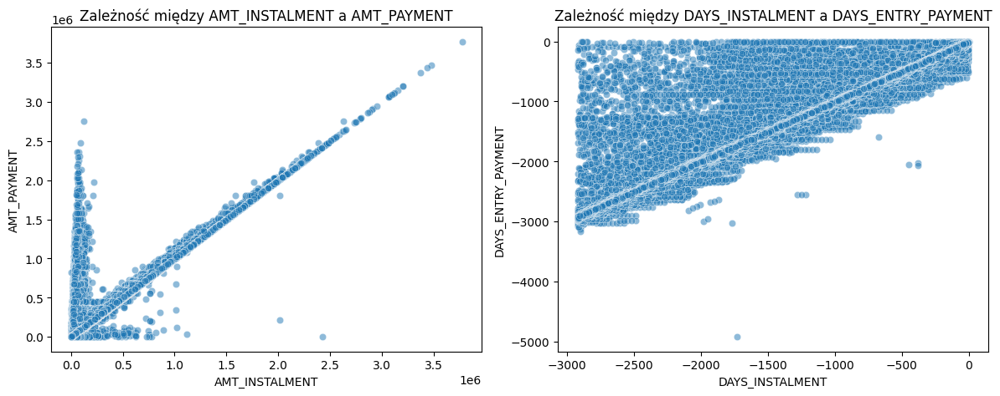

In [74]:
# Tworzenie wykresów
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Wykres dla AMT_INSTALMENT i AMT_PAYMENT
sns.scatterplot(x='AMT_INSTALMENT', y='AMT_PAYMENT', data=installments_payments, alpha=0.5, ax=axs[0])
axs[0].set_title('Zależność między AMT_INSTALMENT a AMT_PAYMENT')
axs[0].set_xlabel('AMT_INSTALMENT')
axs[0].set_ylabel('AMT_PAYMENT')

# Wykres dla DAYS_INSTALMENT i DAYS_ENTRY_PAYMENT
sns.scatterplot(x='DAYS_INSTALMENT', y='DAYS_ENTRY_PAYMENT', data=installments_payments, alpha=0.5, ax=axs[1])
axs[1].set_title('Zależność między DAYS_INSTALMENT a DAYS_ENTRY_PAYMENT')
axs[1].set_xlabel('DAYS_INSTALMENT')
axs[1].set_ylabel('DAYS_ENTRY_PAYMENT')

plt.tight_layout()
plt.show()

Można zauważyć, że jest wiele obserwacji typowo liniowych, gdzie przewidywane równają się z faktycznymi. W związku z tym dla braków danych, których jest bardzo niewiele zostaną one zastąpione wartościami z powiązanych zmiennych.

#### Uzupełnienie braków danych powiązanymi zmiennymi

In [75]:
# Zastępowanie braków danych w DAYS_ENTRY_PAYMENT wartościami z DAYS_INSTALMENT
installments_payments['DAYS_ENTRY_PAYMENT'].fillna(installments_payments['DAYS_INSTALMENT'], inplace=True)

# Zastępowanie braków danych w AMT_PAYMENT wartościami z AMT_INSTALMENT
installments_payments['AMT_PAYMENT'].fillna(installments_payments['AMT_INSTALMENT'], inplace=True)

### Feature Engineering

#### Dodanie nowej zmiennej "IS_DELAYED"

Dodatkowo z powyższych wykresów, szczególnie dotyczących liczby dni, kiedy miała zostać spłacona rata a kiedy faktycznie została, można zaobserwować, że dość często płatności były opóźnione. Zdecydowałem się stworzyć nową zmienną z informacją czy ktoś się spóźniał z płatnościami (jeżeli DAYS_ENTRY_PAYMENT > DAYS_INSTALMENT -> czyli mniejszy minus to znaczy spóźnienie)

In [76]:
#dodanie nowej zmiennej mówiącej o opóźnieniu raty 
installments_payments['IS_DELAYED'] = (installments_payments['DAYS_ENTRY_PAYMENT'] > installments_payments['DAYS_INSTALMENT']).astype(int)

In [77]:
# Dodanie skrótu do każdej zmiennej
installments_payments.columns = ['INSTALLMENTS_PAYMENTS_' + col if col not in ('SK_ID_PREV', 'SK_ID_CURR') else col for col in installments_payments.columns] #zostawienie oryginalne nazwy klucza glównego

In [78]:
#Dodanie nowych zmiennych

# Zmienność kwot rat
installments_payments['INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE'] = installments_payments.groupby('SK_ID_PREV')['INSTALLMENTS_PAYMENTS_AMT_PAYMENT'].transform('std')
# Różnica między planowaną a rzeczywistą kwotą płatności (jako niedopłaty - planowana większa niż zapłacona)
installments_payments['INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT'] = installments_payments['INSTALLMENTS_PAYMENTS_AMT_INSTALMENT'] - installments_payments['INSTALLMENTS_PAYMENTS_AMT_PAYMENT']
# Częstotliwość zmian w harmonogramie rat
installments_payments['INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION_CHANGE'] = installments_payments.groupby('SK_ID_PREV')['INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION'].nunique()


# Agregacja zmiennych
agg_functions = {
    'INSTALLMENTS_PAYMENTS_IS_DELAYED': ['sum', 'mean'],  # Łączna liczba opóźnień i średnia (przy średniej jeżeli jest 1 to znaczy że tylko opóźnienia, im bliżej 1 tym gorzej)
    'INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION': ['nunique'],  # Liczba unikalnych wersji rat
    
    # Dodanie nowych metryk dla zmienności kwot rat
    'INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE': ['mean', 'max'],  
    'INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT': ['mean', 'sum', 'max'],
}

# Agregacja danych
df_installments_payments_agg = installments_payments.groupby('SK_ID_CURR').agg(agg_functions)
df_installments_payments_agg.columns = ['_'.join(col).upper() for col in df_installments_payments_agg.columns.values]
df_installments_payments_agg.reset_index(inplace=True)

# Dodanie ostatniej zmiennej: procentu opóźnień względem wszystkich płatności
df_installments_payments_agg['INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED'] = (df_installments_payments_agg['INSTALLMENTS_PAYMENTS_IS_DELAYED_SUM'] / installments_payments.groupby('SK_ID_CURR')['INSTALLMENTS_PAYMENTS_IS_DELAYED'].transform('count') * 100).fillna(0)


In [79]:
#jak wygląda liczba przypadków w niespłacalności rat
#df_installments_payments_agg['INSTALLMENTS_PAYMENTS_IS_DELAYED_SUM'].value_counts()

### Sprawdzenie zagregowanej tabeli installments_paymnets po zmianach

In [80]:
df_installments_payments_agg.head(1)

,SK_ID_CURR,INSTALLMENTS_PAYMENTS_IS_DELAYED_SUM,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION_NUNIQUE,INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN,INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MEAN,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_SUM,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MAX,INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED
0,100001,1,0.14,2,3842.25,6723.45,0.00,0.00,0.00,0.99


In [81]:
results = []

total_rows = len(df_installments_payments_agg) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_installments_payments_agg:
    unique_values = df_installments_payments_agg[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_installments_payments_agg[column].dtype  # Typ danych
    null_count = df_installments_payments_agg[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_installments_payments_agg[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_installments_payments_agg[column].dtype == 'object':
        values_to_display = df_installments_payments_agg[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,339587,> 5 unikatowych wartości liczbowych,0,0.00
1,INSTALLMENTS_PAYMENTS_IS_DELAYED_SUM,int32,103,> 5 unikatowych wartości liczbowych,0,0.00
2,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,float64,5237,> 5 unikatowych wartości liczbowych,0,0.00
3,INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION_NUNIQUE,int64,50,> 5 unikatowych wartości liczbowych,0,0.00
4,INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN,float64,318328,> 5 unikatowych wartości liczbowych,1018,0.30
5,INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX,float64,304350,> 5 unikatowych wartości liczbowych,1018,0.30
6,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MEAN,float64,160508,> 5 unikatowych wartości liczbowych,0,0.00
7,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_SUM,float64,148109,> 5 unikatowych wartości liczbowych,0,0.00
8,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MAX,float64,119803,> 5 unikatowych wartości liczbowych,0,0.00
9,INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED,float64,5865,> 5 unikatowych wartości liczbowych,0,0.00


In [82]:
# Zastąpienie braków danych medianami dla kolumn INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN oraz INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX

median_1 = df_installments_payments_agg['INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN'].median()
median_2 = df_installments_payments_agg['INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX'].median()

df_installments_payments_agg['INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN'].fillna(median_1, inplace=True)
df_installments_payments_agg['INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX'].fillna(median_2, inplace=True)

In [83]:
# Sprawdzenie usunięcia braków danych: False -> brak jakichkolwiek braków danych
df_installments_payments_agg.isnull().any().any()

False

## Tabela "credit_card_balance"

### Sprawdzenie podstawowych charakterystyk zbioru

In [84]:
credit_card_balance.shape

(3840312, 23)

In [85]:
results = []

total_rows = len(credit_card_balance) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in credit_card_balance:
    unique_values = credit_card_balance[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = credit_card_balance[column].dtype  # Typ danych
    null_count = credit_card_balance[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = credit_card_balance[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif credit_card_balance[column].dtype == 'object':
        values_to_display = credit_card_balance[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_PREV,int64,104307,> 5 unikatowych wartości liczbowych,0,0.00
1,SK_ID_CURR,int64,103558,> 5 unikatowych wartości liczbowych,0,0.00
2,MONTHS_BALANCE,int64,96,> 5 unikatowych wartości liczbowych,0,0.00
3,AMT_BALANCE,float64,1347904,> 5 unikatowych wartości liczbowych,0,0.00
4,AMT_CREDIT_LIMIT_ACTUAL,int64,181,> 5 unikatowych wartości liczbowych,0,0.00
5,AMT_DRAWINGS_ATM_CURRENT,float64,2267,> 5 unikatowych wartości liczbowych,749816,19.52
6,AMT_DRAWINGS_CURRENT,float64,187005,> 5 unikatowych wartości liczbowych,0,0.00
7,AMT_DRAWINGS_OTHER_CURRENT,float64,1832,> 5 unikatowych wartości liczbowych,749816,19.52
8,AMT_DRAWINGS_POS_CURRENT,float64,168748,> 5 unikatowych wartości liczbowych,749816,19.52
9,AMT_INST_MIN_REGULARITY,float64,312266,> 5 unikatowych wartości liczbowych,305236,7.95


In [86]:
# Statystyki dla zmiennych liczbowych
credit_card_balance.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3840312.00,3840312.00,3840312.00,3840312.00,3840312.00,3090496.00,3840312.00,3090496.00,3090496.00,3535076.00,3072324.00,3840312.00,3840312.00,3840312.00,3840312.00,3090496.00,3840312.00,3090496.00,3090496.00,3535076.00,3840312.00,3840312.00
mean,1904503.59,278324.21,-34.52,58300.16,153807.96,5961.32,7433.39,288.17,2968.80,3540.20,10280.54,7588.86,55965.88,58088.81,58098.29,0.31,0.70,0.00,0.56,20.83,9.28,0.33
std,536469.47,102704.48,26.67,106307.03,165145.70,28225.69,33846.08,8201.99,20796.89,5600.15,36078.08,32005.99,102533.62,105965.37,105971.80,1.10,3.19,0.08,3.24,20.05,97.52,21.48
min,1000018.00,100006.00,-96.00,-420250.18,0.00,-6827.31,-6211.62,0.00,0.00,0.00,0.00,0.00,-423305.82,-420250.18,-420250.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,1434385.00,189517.00,-55.00,0.00,45000.00,0.00,0.00,0.00,0.00,0.00,152.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00
50%,1897122.00,278396.00,-28.00,0.00,112500.00,0.00,0.00,0.00,0.00,0.00,2702.70,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.00,0.00,0.00
75%,2369327.75,367580.00,-11.00,89046.69,180000.00,0.00,0.00,0.00,0.00,6633.91,9000.00,6750.00,85359.24,88899.49,88914.51,0.00,0.00,0.00,0.00,32.00,0.00,0.00
max,2843496.00,456250.00,-1.00,1505902.19,1350000.00,2115000.00,2287098.31,1529847.00,2239274.16,202882.01,4289207.45,4278315.69,1472316.79,1493338.19,1493338.19,51.00,165.00,12.00,165.00,120.00,3260.00,3260.00


<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Zmienne AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT decyduję się usunąć ze zbioru ponieważ posiadają praktycznie 20% braki danych, a niosą podobne informacje co zmienna AMT_DRAWINGS_CURRENT
<br> * Tak samo zmienne: CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT	niosą podobne informacje jak zmienna CNT_DRAWINGS_CURRENT
<br> * Zmienna AMT_INST_MIN_REGULARITY również zostaje usunięta z modelu
<br> * Tak samo zmienna AMT_PAYMENT_CURRENT, podobną informację niesie za sobą AMT_PAYMENT_TOTAL_CURRENT

In [87]:
columns_to_drop = ['AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT']

# Usunięcie wybranych kolumn z DataFrame
credit_card_balance = credit_card_balance.drop(columns=columns_to_drop)

### Feature Engineering

In [88]:
# Przed połaczeniem do tabeli installments_payments dodanie skrótu do każdej zmiennej
credit_card_balance.columns = ['CREDIT_CARD_BALANCE_' + col if col not in ('SK_ID_PREV', 'SK_ID_CURR') else col for col in credit_card_balance.columns] #zostawienie oryginalne nazwy klucza glównego

In [89]:
# Agregacje dla istniejących zmiennych
agg_functions = {
    'CREDIT_CARD_BALANCE_MONTHS_BALANCE': ['min', 'max', 'mean'],  # Najwcześniejszy, najpóźniejszy i średni miesiąc salda
    'CREDIT_CARD_BALANCE_AMT_BALANCE': ['sum', 'mean', 'max', 'min', 'std'], # Statystyki salda w miesiącu
    'CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL': ['sum', 'mean', 'max', 'min', 'std'], # Jaki był limit karty kredytowej
    'CREDIT_CARD_BALANCE_AMT_DRAWINGS_CURRENT': ['sum', 'mean', 'max', 'min', 'std'], # Pobrane kwoty
    'CREDIT_CARD_BALANCE_AMT_PAYMENT_TOTAL_CURRENT': ['sum', 'mean', 'max', 'min'], # Wpłaty klienta
    'CREDIT_CARD_BALANCE_AMT_TOTAL_RECEIVABLE': ['sum', 'mean', 'max', 'min', 'std'], # Kwota należności z tytułu karty kredytowej
    'CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT': ['sum', 'mean', 'max', 'min'], # Liczba wpłat w miesiącu
    'CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM': ['sum', 'mean', 'max', 'min'], # Liczba opłacony rat
    'CREDIT_CARD_BALANCE_SK_DPD': ['max', 'mean', 'sum'], # Dni przeterminowania
    'CREDIT_CARD_BALANCE_SK_DPD_DEF': ['max', 'mean', 'sum'] #Dni przeterminowania z ulgą
}

# Agregacja danych
df_credit_card_balance_agg = credit_card_balance.groupby('SK_ID_CURR').agg(agg_functions)

# Nowa zmienna - wykorzystanie kredytu
credit_card_balance['CREDIT_CARD_BALANCE_CREDIT_USE_RATE'] = credit_card_balance['CREDIT_CARD_BALANCE_AMT_BALANCE'] / credit_card_balance['CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL']  # Wykorzystanie kredytu

# Zastąpienie nieskończoności i NaN wynikających z dzielenia przez zero
credit_card_balance.replace([np.inf, -np.inf], np.nan, inplace=True)
credit_card_balance.fillna(0, inplace=True)

# Agregacja nowych zmiennych
new_agg_functions = {
    'CREDIT_CARD_BALANCE_CREDIT_USE_RATE': ['mean', 'max'],
}
df_new_credit_card_balance_agg = credit_card_balance.groupby('SK_ID_CURR').agg(new_agg_functions)

# Połączenie
df_credit_card_balance_agg = df_credit_card_balance_agg.join(df_new_credit_card_balance_agg, on='SK_ID_CURR', how='left', rsuffix='_NEW')


# Zmiana nazw kolumn i resetowanie indeksu
df_credit_card_balance_agg.columns = ['_'.join(col).upper() for col in df_credit_card_balance_agg.columns.values]
df_credit_card_balance_agg.reset_index(inplace=True)

# Agregacja dla kategorii NAME_CONTRACT_STATUS
contract_status_agg = credit_card_balance.groupby('SK_ID_CURR')['CREDIT_CARD_BALANCE_NAME_CONTRACT_STATUS'].value_counts().unstack(fill_value=0)
contract_status_agg.columns = ['CREDIT_CARD_BALANCE_STATUS_' + col for col in contract_status_agg.columns]

# Dołączanie agregacji statusu umowy
df_credit_card_balance_agg = df_credit_card_balance_agg.join(contract_status_agg, on='SK_ID_CURR', how='left')

### Sprawdzenie zagregowanej tabeli credit_card_balance

In [90]:
results = []

total_rows = len(df_credit_card_balance_agg) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_credit_card_balance_agg:
    unique_values = df_credit_card_balance_agg[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_credit_card_balance_agg[column].dtype  # Typ danych
    null_count = df_credit_card_balance_agg[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_credit_card_balance_agg[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_credit_card_balance_agg[column].dtype == 'object':
        values_to_display = df_credit_card_balance_agg[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,103558,> 5 unikatowych wartości liczbowych,0,0.00
1,CREDIT_CARD_BALANCE_MONTHS_BALANCE_MIN,int64,96,> 5 unikatowych wartości liczbowych,0,0.00
2,CREDIT_CARD_BALANCE_MONTHS_BALANCE_MAX,int64,7,> 5 unikatowych wartości liczbowych,0,0.00
3,CREDIT_CARD_BALANCE_MONTHS_BALANCE_MEAN,float64,570,> 5 unikatowych wartości liczbowych,0,0.00
4,CREDIT_CARD_BALANCE_AMT_BALANCE_SUM,float64,69080,> 5 unikatowych wartości liczbowych,0,0.00
5,CREDIT_CARD_BALANCE_AMT_BALANCE_MEAN,float64,70080,> 5 unikatowych wartości liczbowych,0,0.00
6,CREDIT_CARD_BALANCE_AMT_BALANCE_MAX,float64,66374,> 5 unikatowych wartości liczbowych,0,0.00
7,CREDIT_CARD_BALANCE_AMT_BALANCE_MIN,float64,13320,> 5 unikatowych wartości liczbowych,0,0.00
8,CREDIT_CARD_BALANCE_AMT_BALANCE_STD,float64,69961,> 5 unikatowych wartości liczbowych,692,0.67
9,CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL_SUM,int64,2843,> 5 unikatowych wartości liczbowych,0,0.00


### Obsługa braków danych

Braków danych jest bardzo mało więc decyduję się na zastąpienie ich medianami.

In [91]:
# Zastąpienie braków danych średnią dla kolumny INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MEAN oraz INSTALLMENTS_PAYMENTS_PAYMENT_CHANGE_MAX
median_1 = df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_BALANCE_STD'].median()
median_2 = df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL_STD'].median()
median_3 = df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_DRAWINGS_CURRENT_STD'].median()
median_4 = df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_TOTAL_RECEIVABLE_STD'].median()

df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_BALANCE_STD'].fillna(median_1, inplace=True)
df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL_STD'].fillna(median_2, inplace=True)
df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_DRAWINGS_CURRENT_STD'].fillna(median_3, inplace=True)
df_credit_card_balance_agg['CREDIT_CARD_BALANCE_AMT_TOTAL_RECEIVABLE_STD'].fillna(median_4, inplace=True)

In [92]:
# Sprawdzenie usunięcia braków danych: False -> brak jakichkolwiek braków danych
df_installments_payments_agg.isnull().any().any()

False

# Połączenie źródeł danych

Kiedy mam już odpowiednio zagregowane wszystkie tabele należy je teraz odpowiednio dołączyć do tabeli głównej "application"

## Połączenie "df_bik" i "application"

In [93]:
df = application.merge(df_bik_final, on='SK_ID_CURR', how='left')

### Przegląd danych po połączeniu

In [94]:
df.shape

(307511, 99)

Zgadza się, tabela application miała 68 kolumn, tabele df_bik 32 (w tym klucz)

In [95]:
results = []

total_rows = len(df) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df:
    unique_values = df[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df[column].dtype  # Typ danych
    null_count = df[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df[column].dtype == 'object':
        values_to_display = df[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,307511,> 5 unikatowych wartości liczbowych,0,0.00
1,TARGET,int64,2,"[1, 0]",0,0.00
2,NAME_CONTRACT_TYPE,object,2,"[Cash loans, Revolving loans]",0,0.00
3,CODE_GENDER,object,3,"[M, F, XNA]",0,0.00
4,FLAG_OWN_CAR,object,2,"[N, Y]",0,0.00
5,FLAG_OWN_REALTY,object,2,"[Y, N]",0,0.00
6,CNT_CHILDREN,int64,15,> 5 unikatowych wartości liczbowych,0,0.00
7,AMT_INCOME_TOTAL,float64,2548,> 5 unikatowych wartości liczbowych,0,0.00
8,AMT_CREDIT,float64,5603,> 5 unikatowych wartości liczbowych,0,0.00
9,AMT_ANNUITY,float64,13672,> 5 unikatowych wartości liczbowych,0,0.00


<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> Po połączeniu danych left_joinem do tabeli application, można zaobserwować, że wszystkie kolumny z tabeli BIK mają taką samą liczbę braków danych. Oznacza to, że po prostu brakuje dla nich wartości w tabeli application. Takie braki danych pozostaną i będą przedstawione jako osobne kategorie niosące informacje

## Połączenie "application" ze wszystkimi tabelami o poprzednich aplikacjach i produktach 

Tabela 'previous application' zawiera historie wcześniejszych wniosków kredytowych każdego klienta. Pozostałe 3 tabele: 'POS_CASH_balance', 'instalments_payments' oraz 'credit_card_balance' są połączone zarówno z 'previous_application' przez SK_ID_PREV jak równiez z 'application' przez SK_ID_CURR.dajność Twojego modelu.


W związku z tym decyduje się na połączenie tych 4 tabel od razu do poziomu tabeli 'application'. W ten sposób liczba wierszy w application zostanie taka sama, będzie zawierała dodatkowe informacje zagregowane o poprzednich produktach konkretnych klientów.

In [96]:
df.shape

(307511, 99)

In [97]:
df_previous_application_agg.shape

(338857, 73)

In [98]:
df_POS_CASH_agg.shape

(337252, 26)

In [99]:
df_installments_payments_agg.shape

(339587, 10)

In [100]:
df_credit_card_balance_agg.shape

(103558, 51)

In [101]:
df = df.merge(df_previous_application_agg, on='SK_ID_CURR', how='left')
df = df.merge(df_POS_CASH_agg, on='SK_ID_CURR', how='left')
df = df.merge(df_installments_payments_agg, on='SK_ID_CURR', how='left')
df = df.merge(df_credit_card_balance_agg, on='SK_ID_CURR', how='left')

In [102]:
df.shape

(307511, 255)

Łączie powinienem uzyskać (99 + 68 + 25 + 9 + 50 = 249) 251 kolumn i tak też jest. W związku z tym połaczenie można uznać za poprawne.

## Ostateczna tabela df do analizy po połączeniu 

In [103]:
results = []

total_rows = len(df) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df:
    unique_values = df[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df[column].dtype  # Typ danych
    null_count = df[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df[column].dtype == 'object':
        values_to_display = df[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)
results_df

,Variable,Data Type,Unique Values Count,Unique Values,Null Values Count,Null Values %
0,SK_ID_CURR,int64,307511,> 5 unikatowych wartości liczbowych,0,0.00
1,TARGET,int64,2,"[1, 0]",0,0.00
2,NAME_CONTRACT_TYPE,object,2,"[Cash loans, Revolving loans]",0,0.00
3,CODE_GENDER,object,3,"[M, F, XNA]",0,0.00
4,FLAG_OWN_CAR,object,2,"[N, Y]",0,0.00
5,FLAG_OWN_REALTY,object,2,"[Y, N]",0,0.00
6,CNT_CHILDREN,int64,15,> 5 unikatowych wartości liczbowych,0,0.00
7,AMT_INCOME_TOTAL,float64,2548,> 5 unikatowych wartości liczbowych,0,0.00
8,AMT_CREDIT,float64,5603,> 5 unikatowych wartości liczbowych,0,0.00
9,AMT_ANNUITY,float64,13672,> 5 unikatowych wartości liczbowych,0,0.00


<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> * Można zauważyć, że dla każdej kolumny dodanej z konkretnej tabeli występuje tyle samo braków danych. Wynika to z faktu, że po prostu takie dane nie występują dla jakiegoś % aktualnych ID wniosków kredytowych. 
<br> * W przypadku takich braków danych najlepiej jest po prostu zachować informację o braku danych, ale jest to tylko możliwe dla zmiennych kategorycznych.
<br> * Zmienne ilościowe trzeba albo zaimputować, albo odpowiednio skategoryzować, nadając kolejno grupę z brakami danych. Braki danych dla każdej z dodatkowych tabel mają przynajmniej 5%, więc można byłoby utworzyć takie kategorie dla każdej ze zmiennych.

### Obsługa braków danych dla kolumn jakościowych

In [104]:
categorical_columns = df.select_dtypes(exclude=[np.number]).columns

# Obsługa braków danych dla zmiennych jakościowych
df[categorical_columns] = df[categorical_columns].fillna('Brak danych')

# Przygotowanie danych cz.II

In [105]:
df.shape

(307511, 255)

In [106]:
# df.to_csv('df.csv', index=False) # Zapisanie całego zbioru do csv, aby móc zrobić obliczeniania w programie statistica

## Podział na zbiór uczący i testowy

Dokonuję podziału na zbiór uczący i testowy już teraz, przed selekcją zmiennych i dyskretyzacją tak, żeby nie przeuczyć modelu. Wszystkie działania powinny odbywać się wyłącznie na zbiorze uczącym, a następnie powinniśmy dostosować zbiór testowy do uczącego, np. pod względem przyjętych zmiennych. 

Podziału na zbiór uczący i testowy dokonam w programie Statistica.
Mój zbiór był niezbilansowany więc wykonałem technikę oversampling na zbiorze uczącym.

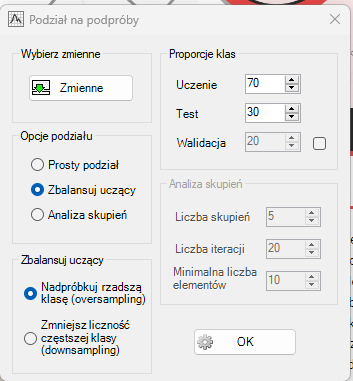

In [107]:
# Sprytny sposób jak wykryć format niestandardowego kodowania pliku csv
#pip install chardet
import chardet

# Sprawdzenie kodowania pliku
with open('df_proby.csv', 'rb') as file:
    result = chardet.detect(file.read(10000))  # Czytaj tylko część pliku, aby przyspieszyć operację
    encoding = result['encoding']
    print("Wykryte kodowanie:", encoding)

Wykryte kodowanie: ISO-8859-1


In [108]:
df_all = pd.read_csv('df_proby.csv', encoding='ISO-8859-1', sep=';', decimal=',')

In [109]:
df_all.shape

(513897, 252)

In [110]:
df_all.dtypes

SK_ID_CURR                                                                      int64
TARGET                                                                          int64
NAME_CONTRACT_TYPE                                                             object
CODE_GENDER                                                                    object
FLAG_OWN_CAR                                                                   object
FLAG_OWN_REALTY                                                                object
CNT_CHILDREN                                                                    int64
AMT_INCOME_TOTAL                                                              float64
AMT_CREDIT                                                                    float64
AMT_ANNUITY                                                                   float64
AMT_GOODS_PRICE                                                               float64
NAME_TYPE_SUITE                                       

In [111]:
df_all.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MIN,BUREAU_CREDIT_DAY_OVERDUE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_SUM,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MIN,BUREAU_CNT_CREDIT_PROLONG_MEAN,BUREAU_CNT_CREDIT_PROLONG_SUM,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,BUREAU_AMT_CREDIT_SUM_DEBT_SUM,BUREAU_AMT_CREDIT_SUM_LIMIT_SUM,BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_OVERDUE_SUM,BUREAU_DAYS_CREDIT_UPDATE_MAX,BUREAU_DAYS_CREDIT_UPDATE_MIN,BUREAU_MOST_FREQ_CREDIT_ACTIVE,BUREAU_MOST_FREQ_CREDIT_CURRENCY,BUREAU_MOST_FREQ_CREDIT_TYPE,BUREAU_BALANCE_STATUS_0,BUREAU_BALANCE_STATUS_1,BUREAU_BALANCE_STATUS_2,BUREAU_BALANCE_STATUS_3,BUREAU_BALANCE_STATUS_4,BUREAU_BALANCE_STATUS_5,BUREAU_BALANCE_STATUS_C,BUREAU_BALANCE_STATUS_X,PREVIOUS_APPLICATION_AMT_ANNUITY_MEAN,PREVIOUS_APPLICATION_AMT_ANNUITY_MAX,PREVIOUS_APPLICATION_AMT_ANNUITY_MIN,PREVIOUS_APPLICATION_AMT_ANNUITY_SUM,PREVIOUS_APPLICATION_AMT_APPLICATION_MEAN,PREVIOUS_APPLICATION_AMT_APPLICATION_MAX,PREVIOUS_APPLICATION_AMT_APPLICATION_MIN,PREVIOUS_APPLICATION_AMT_APPLICATION_SUM,PREVIOUS_APPLICATION_AMT_CREDIT_MEAN,PREVIOUS_APPLICATION_AMT_CREDIT_MAX,PREVIOUS_APPLICATION_AMT_CREDIT_MIN,PREVIOUS_APPLICATION_AMT_CREDIT_SUM,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MEAN,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MAX,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MIN,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_SUM,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MEAN,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MIN,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MAX,PREVIOUS_APPLICATION_DAYS_DECISION_MEAN,PREVIOUS_APPLICATION_DAYS_DECISION_MAX,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MEAN,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MAX,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MIN,PREVIOUS_APPLICATION_PREV_APPS_COUNT,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CASH LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CONSUMER LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_XNA,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_FRIDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_MONDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_SATURDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_SUNDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_THURSDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_TUESDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_WEDNESDAY,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_APPROVED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_CANCELED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_UNUSED OFFER,PREVIOUS

In [112]:
df_all.tail(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MIN,BUREAU_CREDIT_DAY_OVERDUE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_SUM,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MIN,BUREAU_CNT_CREDIT_PROLONG_MEAN,BUREAU_CNT_CREDIT_PROLONG_SUM,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,BUREAU_AMT_CREDIT_SUM_DEBT_SUM,BUREAU_AMT_CREDIT_SUM_LIMIT_SUM,BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN,BUREAU_AMT_CREDIT_SUM_OVERDUE_SUM,BUREAU_DAYS_CREDIT_UPDATE_MAX,BUREAU_DAYS_CREDIT_UPDATE_MIN,BUREAU_MOST_FREQ_CREDIT_ACTIVE,BUREAU_MOST_FREQ_CREDIT_CURRENCY,BUREAU_MOST_FREQ_CREDIT_TYPE,BUREAU_BALANCE_STATUS_0,BUREAU_BALANCE_STATUS_1,BUREAU_BALANCE_STATUS_2,BUREAU_BALANCE_STATUS_3,BUREAU_BALANCE_STATUS_4,BUREAU_BALANCE_STATUS_5,BUREAU_BALANCE_STATUS_C,BUREAU_BALANCE_STATUS_X,PREVIOUS_APPLICATION_AMT_ANNUITY_MEAN,PREVIOUS_APPLICATION_AMT_ANNUITY_MAX,PREVIOUS_APPLICATION_AMT_ANNUITY_MIN,PREVIOUS_APPLICATION_AMT_ANNUITY_SUM,PREVIOUS_APPLICATION_AMT_APPLICATION_MEAN,PREVIOUS_APPLICATION_AMT_APPLICATION_MAX,PREVIOUS_APPLICATION_AMT_APPLICATION_MIN,PREVIOUS_APPLICATION_AMT_APPLICATION_SUM,PREVIOUS_APPLICATION_AMT_CREDIT_MEAN,PREVIOUS_APPLICATION_AMT_CREDIT_MAX,PREVIOUS_APPLICATION_AMT_CREDIT_MIN,PREVIOUS_APPLICATION_AMT_CREDIT_SUM,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MEAN,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MAX,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_MIN,PREVIOUS_APPLICATION_AMT_GOODS_PRICE_SUM,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MEAN,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MIN,PREVIOUS_APPLICATION_HOUR_APPR_PROCESS_START_MAX,PREVIOUS_APPLICATION_DAYS_DECISION_MEAN,PREVIOUS_APPLICATION_DAYS_DECISION_MAX,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MEAN,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MAX,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MIN,PREVIOUS_APPLICATION_PREV_APPS_COUNT,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CASH LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CONSUMER LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_XNA,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_FRIDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_MONDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_SATURDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_SUNDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_THURSDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_TUESDAY,PREVIOUS_APPLICATION_WEEKDAY_APPR_PROCESS_START_WEDNESDAY,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_APPROVED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_CANCELED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_UNUSED OFFER,PREVIOUS

In [113]:
# Podział na dwa zbiory train-uczący i test

df_train = df_all[df_all['Próba'] == 'Uczenie']
df_test = df_all[df_all['Próba'] == 'Test']

In [114]:
# Usunięcie z tych zbiorów kolumny 'Próba'

df_train = df_train.drop(columns=['Próba'])
df_test = df_test.drop(columns=['Próba'])

## Sprawdzenie tabel df_train i df_test do dalszego modelowania

### Zbiór treningowy

In [115]:
df_train.shape

(452394, 251)

In [116]:
# Obliczenie liczby wystąpień zmiennej celu oraz jej procentowego udziału w zbiorze danych
value_counts = df_train['TARGET'].value_counts()
percentage = (df_train['TARGET'].value_counts() / len(df_train)) * 100

# Stworzenie DataFrame
summary_table = pd.DataFrame({
    'Value': value_counts.index,
    'Count': value_counts.values,
    'Percentage (%)': percentage.values
})

print(summary_table)

   Value   Count  Percentage (%)
0      0  226197           50.00
1      1  226197           50.00


Można zaobserwować, że zbiór treningowy/uczacy został zbilansowany metodą oversampling

### Zbiór testowy

In [117]:
df_test.shape

(61503, 251)

In [118]:
# Obliczenie liczby wystąpień zmiennej celu oraz jej procentowego udziału w zbiorze danych
value_counts = df_test['TARGET'].value_counts()
percentage = (df_test['TARGET'].value_counts() / len(df_test)) * 100

# Stworzenie DataFrame
summary_table = pd.DataFrame({
    'Value': value_counts.index,
    'Count': value_counts.values,
    'Percentage (%)': percentage.values
})

print(summary_table)

   Value  Count  Percentage (%)
0      0  56489           91.85
1      1   5014            8.15


Zbiór testowy natomiast nadal pozostaje niezbilansowany, żeby wyniki modeli były wiarygodne.

In [119]:
# Zrzucenie tabeli treningowej do csv, żeby można było ją zaczytać do Statistici
# df_train.to_csv('df_train1.csv', index=False)

## Redukcja liczby zmiennych - odrzucenie słabych zmiennych

Wejściowy zbiór danych zawiera aż 249 zmiennych objaśniających. Jest to zdecydowanie za dużo i w pierwszej kolejności ograniczę liczbę tych zmiennych poprzez tzw. 'metody oparte na filtrach', czyli grupę metod, które są dość proste ale skuteczne. W ich skład wchodzi m.in. ustalenie Information Value (IV) oraz sprawdzenie korelacji miedzy zmiennymi, które przy zbyt wysokich wartościach mogą być współzależne miedzy sobą. Oczywiście w ramach tej grypy metod istnieją równiez inne jak próg wariancji, Chi kwadrat, Fisher Score i wiele innych, ale na potrzeby tego projektu, skorzystam głównie z tych dwóch.

### Wybór predyktorów - Statistica

Pierwszy etapem ograniczenia liczby zmiennych będzie skorzystanie z dostępnego pakietu scoringowego w programie Statistica. W ramach tego pakietu dostępne są dwie możliwości redukcji liczby zmiennych: wybór predyktorów oraz wybór reprezentantów. W pierwszej kolejności skupię się na ograniczeniu liczby zmiennych poprzez funkcjonalność wyboru predyktorów.

Skorzystanie z opcji Wybór predyktorów - Ranking predyktorów umożliwia wykonanie rankingu zmiennych na podstawie miar Information Value, V Cramera oraz Gini a następnie ograniczenie zbioru danych jedynie do zmiennych istotnie wpływających na badane zjawisko. 

Tak wygląda ta funkcjonalność w programie statistica:

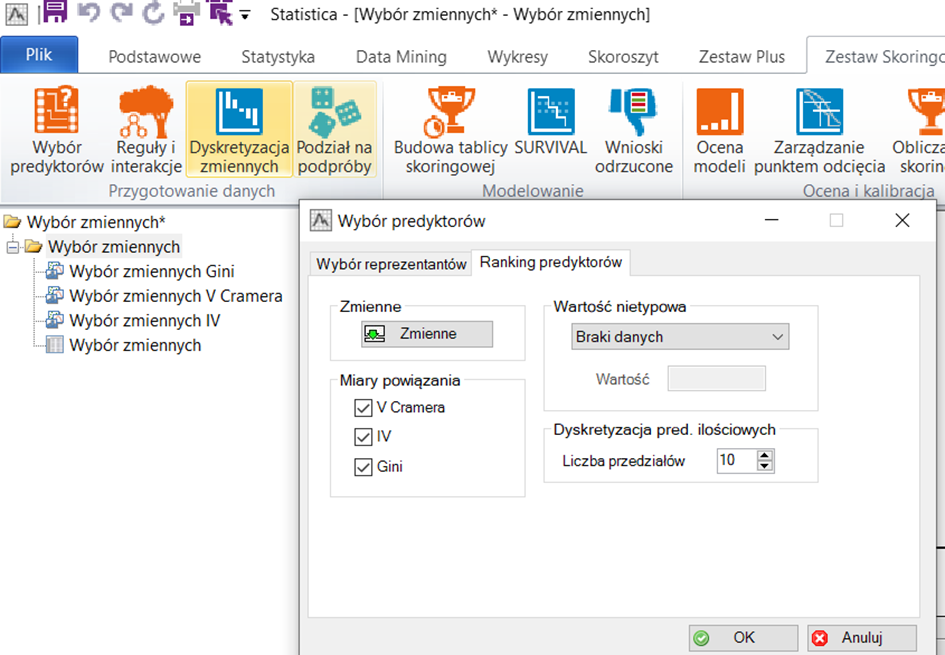

Obszar Miary powiązania umożliwia wybór trzech miar siły predykcyjnej V Cramera, IV (Information Value) oraz wskaźnika Gini.

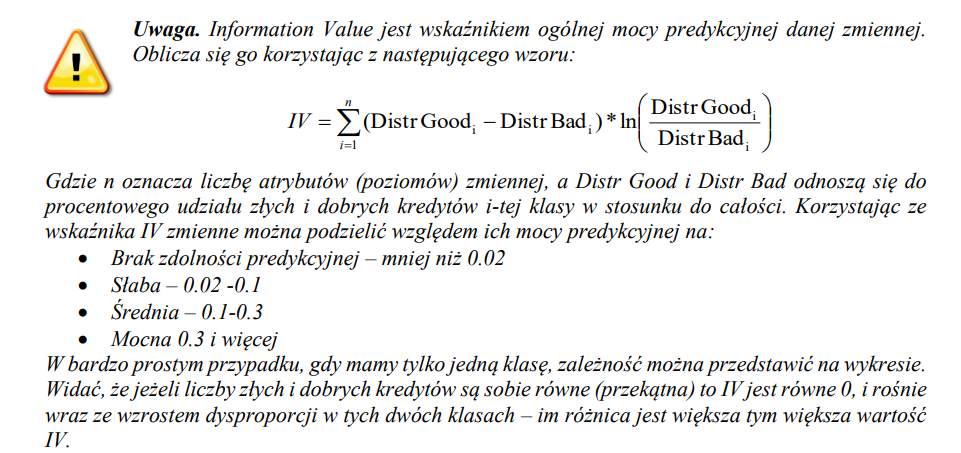

Obszar Wartość nietypowa pozwala na uwzględnienie w obliczeniach brakujących danych lub specjalne potraktowanie wartości wskazanej przez użytkownika jako nietypowa. Wybór opcji Brak danych powoduje, że brakujące dane są traktowane w analizie jako osobna kategoria i tym samym mają wpływ na obliczanie mocy predykcyjnej danej zmiennej.

Pole Liczba przedziałów znajdująca się w obszarze Dyskretyzacja pred. ilościowych pozwala określić liczbę równolicznych przedziałów, na jakie zostanie podzielona każda zmienna ilościowa przed obliczeniem miar powiązania. Jeżeli w obszarze Wartość nietypowa wskazano Wskaż wartość lub Brak danych, to będą one stanowiły dodatkową kategorię.

W polu zmienne wybrałem zmienną zależną jakościową oraz predyktory jakościowe i ilościowe. 

Następnie otrzymałem ranking:

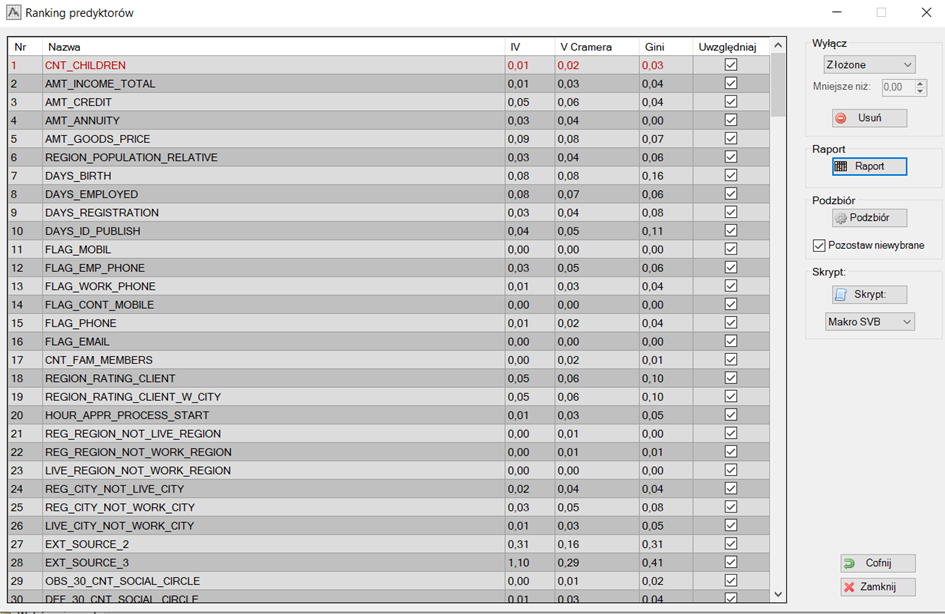

Wczytany zbiór danych z miarami poniżej

In [120]:
ranking_predyktorow = pd.read_excel('ranking predyktorow.xlsx', engine='openpyxl')

In [121]:
ranking_predyktorow

,Zmienna,IV,V Cramera,Gini
0,EXT_SOURCE_3,0.33,0.28,0.25
1,EXT_SOURCE_2,0.32,0.27,0.31
2,BUREAU_DAYS_CREDIT_MEAN,0.12,0.17,0.10
3,DAYS_BIRTH,0.09,0.15,0.17
4,AMT_GOODS_PRICE,0.09,0.15,0.07
5,OCCUPATION_TYPE,0.09,0.15,0.07
6,DAYS_EMPLOYED,0.08,0.14,0.07
7,BUREAU_DAYS_CREDIT_MAX,0.08,0.14,0.07
8,BUREAU_DAYS_CREDIT_MIN,0.08,0.14,0.07
9,ORGANIZATION_TYPE,0.08,0.14,0.05


Na podstawie informacji dotyczącej przedziałów wartośći IV, można sądzić, że najlepszymi zmiennymi do modelu będą:
* EXT_SOURCE_3
* EXT_SOURCE_2
* BUREAU_DAYS_CREDIT_MEAN	
* AMT_GOODS_PRICE
* DAYS_BIRTH

Na początek usuwam wszystkie zmienne, które mają wszystkie słabe współczynniki jednocześnie dla każdej z miar, czyli zarówno:
* IV < 0,05 (bardzo słabe zmienne są poniżej 0,02 ale 0,05 to wciąż słabe predykcje, zmiennych mam na tyle dużo, że mogę pozwolić sobie na wybór tylko tych powyżej 0,05); 
* V Cramera < 0,05;
* Gini < 0,05

In [122]:
# Definiowanie warunków
condition = (ranking_predyktorow['IV'] < 0.05) & (ranking_predyktorow['V Cramera'] < 0.05) & (ranking_predyktorow['Gini'] < 0.05)

In [123]:
# Filtrowanie DataFrame, aby znaleźć rekordy spełniające te dwa warunki
filtered_rows = ranking_predyktorow[condition]

In [124]:
filtered_rows.head(5) #ok

,Zmienna,IV,V Cramera,Gini
178,CNT_CHILDREN,0.01,0.04,0.04
179,FLAG_PHONE,0.01,0.04,0.04
180,FLAG_OWN_CAR,0.01,0.04,0.04
181,POS_CASH_CNT_INSTALMENT_FUTURE_MIN,0.01,0.04,0.03
182,CREDIT_CARD_BALANCE_MONTHS_BALANCE_MAX,0.01,0.04,0.03


In [125]:
filtered_rows.shape

(70, 4)

In [126]:
var_to_drop = filtered_rows['Zmienna'].tolist()

In [127]:
df_train.drop(columns=var_to_drop, inplace=True)
df_test.drop(columns=var_to_drop, inplace=True)
df_all.drop(columns=var_to_drop, inplace=True)

In [128]:
df_train.shape #pozostało 181 zmiennych, usunięto 70 czyli tak jak miało być

(452394, 181)

In [129]:
df_test.shape

(61503, 181)

In [130]:
df_all.shape #df_all będzie zawsze zawierał o 1 zmienną więcej. Jest to zmienna Próba, która wskazuje na rozróżnienie między zbiorem uczacym a testowym

(513897, 182)

### Szczegółowa redukcja zmiennych w oparciu o ranking predyktorów i miary IV, V Cramera orz Gini

In [131]:
# Ranking pozostałych zmiennych z dołączeniem informacji o typie danych konkretnej zmiennej
rest_predictors = ranking_predyktorow[~ranking_predyktorow['Zmienna'].isin(filtered_rows['Zmienna'])]
predictors = pd.merge(rest_predictors,results_df[['Variable','Data Type']], how='inner', left_on='Zmienna', right_on='Variable')
predictors[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]

,Zmienna,Data Type,IV,V Cramera,Gini
0,EXT_SOURCE_3,float64,0.33,0.28,0.25
1,EXT_SOURCE_2,float64,0.32,0.27,0.31
2,BUREAU_DAYS_CREDIT_MEAN,float64,0.12,0.17,0.10
3,DAYS_BIRTH,int64,0.09,0.15,0.17
4,AMT_GOODS_PRICE,float64,0.09,0.15,0.07
5,OCCUPATION_TYPE,object,0.09,0.15,0.07
6,DAYS_EMPLOYED,int64,0.08,0.14,0.07
7,BUREAU_DAYS_CREDIT_MAX,float64,0.08,0.14,0.07
8,BUREAU_DAYS_CREDIT_MIN,float64,0.08,0.14,0.07
9,ORGANIZATION_TYPE,object,0.08,0.14,0.05


#### Zbadanie wspł. V Cramera

In [132]:
# Współczynnik V-Creamera można stosować wyłącznie do zmiennych kategorycznych, w zwiazku z tym zostanie on szczegółowo sprawdzony dla tych zmiennych
category_cols = predictors[predictors['Data Type'] == 'object']
category_cols[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]

,Zmienna,Data Type,IV,V Cramera,Gini
5,OCCUPATION_TYPE,object,0.09,0.15,0.07
9,ORGANIZATION_TYPE,object,0.08,0.14,0.05
10,BUREAU_MOST_FREQ_CREDIT_ACTIVE,object,0.07,0.13,0.13
15,NAME_INCOME_TYPE,object,0.06,0.12,0.10
27,NAME_EDUCATION_TYPE,object,0.05,0.11,0.08
33,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_PRODUCT_COMBINATION,object,0.05,0.11,0.02
40,CODE_GENDER,object,0.04,0.10,0.10
82,BUREAU_MOST_FREQ_CREDIT_TYPE,object,0.03,0.08,0.05
103,NAME_FAMILY_STATUS,object,0.02,0.07,0.04
139,NAME_CONTRACT_TYPE,object,0.01,0.06,0.03


In [133]:
# Definiowanie warunków
condition = (category_cols['IV'] <= 0.05) & (category_cols['V Cramera'] <= 0.05)

In [134]:
# Filtrowanie DataFrame, aby znaleźć rekordy spełniające wszystkie trzy warunki
filtered_rows = category_cols[condition]
filtered_rows[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]

,Zmienna,Data Type,IV,V Cramera,Gini
158,BUREAU_MOST_FREQ_CREDIT_CURRENCY,object,0.01,0.05,0.04


In [135]:
var_to_drop = filtered_rows['Zmienna'].tolist()
var_to_drop

['BUREAU_MOST_FREQ_CREDIT_CURRENCY']

In [136]:
df_train.drop(columns=var_to_drop, inplace=True)
df_test.drop(columns=var_to_drop, inplace=True)
df_all.drop(columns=var_to_drop, inplace=True)

In [137]:
df_train.shape #usunąłem 1 zmienną kategoryczną, która miała bardzo słabe IV oraz V Cramera (nie patrzyłem na Giniego)

(452394, 180)

In [138]:
df_test.shape

(61503, 180)

In [139]:
df_all.shape

(513897, 181)

#### Zbadanie wskaźnika Giniego

In [140]:
# Współczynnik Giniego najlepiej stosować do zmiennych ilościowych
numeric_cols = predictors[(predictors['Data Type'] == 'float64') | (predictors['Data Type'] == 'int64')]
numeric_cols[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]

,Zmienna,Data Type,IV,V Cramera,Gini
0,EXT_SOURCE_3,float64,0.33,0.28,0.25
1,EXT_SOURCE_2,float64,0.32,0.27,0.31
2,BUREAU_DAYS_CREDIT_MEAN,float64,0.12,0.17,0.10
3,DAYS_BIRTH,int64,0.09,0.15,0.17
4,AMT_GOODS_PRICE,float64,0.09,0.15,0.07
6,DAYS_EMPLOYED,int64,0.08,0.14,0.07
7,BUREAU_DAYS_CREDIT_MAX,float64,0.08,0.14,0.07
8,BUREAU_DAYS_CREDIT_MIN,float64,0.08,0.14,0.07
11,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,float64,0.07,0.13,0.06
12,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,float64,0.06,0.12,0.13


In [141]:
numeric_cols.shape # Zgadza się, powinno być 162 kolumn numerycznych i jest

(162, 6)

In [142]:
# Definiowanie warunków (sprawdzono wszystkie zmienne, gdzie IV <0,05 i jednocześnie Gini <0,05 i zdecydowano o przyjęciu takich kryteriów usuniecia)
condition = (numeric_cols['IV'] <= 0.05) & (numeric_cols['Gini'] <= 0.05)

In [143]:
# Filtrowanie DataFrame, aby znaleźć rekordy spełniające te dwa warunki
filtered_rows = numeric_cols[condition]
filtered_rows[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]

,Zmienna,Data Type,IV,V Cramera,Gini
21,BUREAU_AMT_CREDIT_SUM_DEBT_MEAN,float64,0.05,0.12,0.04
28,BUREAU_DAYS_CREDIT_UPDATE_MAX,float64,0.05,0.11,0.04
29,CREDIT_CARD_BALANCE_AMT_DRAWINGS_CURRENT_MEAN,float64,0.05,0.11,0.04
30,CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT_MAX,float64,0.05,0.11,0.04
31,BUREAU_AMT_CREDIT_SUM_DEBT_SUM,float64,0.05,0.11,0.03
32,CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM_MEAN,float64,0.05,0.11,0.02
43,AMT_CREDIT,float64,0.04,0.10,0.04
44,CREDIT_CARD_BALANCE_AMT_BALANCE_MEAN,float64,0.04,0.10,0.04
45,CREDIT_CARD_BALANCE_AMT_DRAWINGS_CURRENT_STD,float64,0.04,0.10,0.04
46,CREDIT_CARD_BALANCE_AMT_TOTAL_RECEIVABLE_MEAN,float64,0.04,0.10,0.04


In [144]:
var_to_drop = filtered_rows['Zmienna'].tolist()
len(var_to_drop)

108

In [145]:
df_train.drop(columns=var_to_drop, inplace=True) #usuwam te wszystkie 108 kolumn
df_test.drop(columns=var_to_drop, inplace=True)
df_all.drop(columns=var_to_drop, inplace=True)

In [146]:
df_train.shape # pozostało 72 kolumny OK

(452394, 72)

In [147]:
df_test.shape

(61503, 72)

In [148]:
df_all.shape

(513897, 73)

#### Zbadanie wskaźnika IV

Decyduję się na usunięcie wszystkie zmiennych, które mają wskaźnik IV mniejszy od 0,02, nawet jeżeli Gini wynosi więcej niż 0,05

In [149]:
condition = (ranking_predyktorow['IV'] < 0.02)

In [150]:
filtered_rows = ranking_predyktorow[condition]

In [151]:
var_to_drop = filtered_rows['Zmienna'].tolist()
var_to_drop

['PREVIOUS_APPLICATION_DAYS_DECISION_MAX',
 'LIVE_CITY_NOT_WORK_CITY',
 'POS_CASH_CNT_INSTALMENT_MIN',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'BUREAU_BALANCE_STATUS_3',
 'BUREAU_BALANCE_STATUS_4',
 'BUREAU_BALANCE_STATUS_5',
 'FLAG_DOCUMENT_6',
 'BUREAU_BALANCE_STATUS_2',
 'PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CONSUMER LOANS',
 'NAME_CONTRACT_TYPE',
 'NAME_HOUSING_TYPE',
 'PREVIOUS_APPLICATION_AMT_ANNUITY_SUM',
 'PREVIOUS_APPLICATION_AMT_CREDIT_MEAN',
 'POS_CASH_CNT_INSTALMENT_MAX',
 'POS_CASH_CNT_INSTALMENT_FUTURE_MAX',
 'INSTALLMENTS_PAYMENTS_NUM_INSTALMENT_VERSION_NUNIQUE',
 'CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM_MIN',
 'PREVIOUS_APPLICATION_AMT_CREDIT_SUM',
 'CREDIT_CARD_BALANCE_AMT_CREDIT_LIMIT_ACTUAL_SUM',
 'PREVIOUS_APPLICATION_AMT_APPLICATION_SUM',
 'PREVIOUS_APPLICATION_AMT_GOODS_PRICE_SUM',
 'PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_CASH_LOAN_PURPOSE',
 'HOUR_APPR_PROCESS_START',
 'PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_CASH LOANS',
 'AMT_INCOME_TOTAL',
 'F

Usuwam tylko te kolumny, których nie usunąłem wcześniej

In [152]:
# Usuń kolumny z df_train, jeśli istnieją
df_train.drop(columns=[col for col in var_to_drop if col in df_train.columns], inplace=True)

# Usuń kolumny z df_test, jeśli istnieją
df_test.drop(columns=[col for col in var_to_drop if col in df_test.columns], inplace=True)

# Usuń kolumny z df_all, jeśli istnieją
df_all.drop(columns=[col for col in var_to_drop if col in df_all.columns], inplace=True)

In [153]:
df_train.shape

(452394, 68)

In [154]:
df_test.shape

(61503, 68)

In [155]:
df_all.shape

(513897, 69)

Jak widać takich kolumn było tylko 4

In [156]:
# Dodatkowe usunięcie zmiennej FLAG_DOCUMENT_12, ponieważ z jakiegoś powodu nie została ona uwzględniona w rankingu predyktorów ale posiada bardzo niskie wartości IV
var_to_drop = ['FLAG_DOCUMENT_12']

df_train.drop(columns=var_to_drop, inplace=True) #usuwam te wszystkie 108 kolumn
df_test.drop(columns=var_to_drop, inplace=True)
df_all.drop(columns=var_to_drop, inplace=True)

In [157]:
df_train.shape

(452394, 67)

In [158]:
df_test.shape

(61503, 67)

In [159]:
df_all.shape

(513897, 68)

#### Sprawdzenie wyników wstępnej redukcji zmiennych

In [160]:
# Sprawdzenie jakie zmienne pozostały w zbiorze danych
results = []

total_rows = len(df_train) # Liczba wierszy w tabeli

# Iteracja po każdej kolumnie
for column in df_train:
    unique_values = df_train[column].nunique() # Liczba unikatowych wartości w konkretnej kolumnie
    data_type = df_train[column].dtype  # Typ danych
    null_count = df_train[column].isnull().sum()  # Liczba nulli
    null_percent = (null_count / total_rows) * 100 # % nulli

    # Warunki potrzebne do wyświetlania unikalnych wartości
    # Jeżeli dla zmiennej jest ich mak 5 to pokazuje bez róznicy na typ danych
    if unique_values <= 5:
        values_to_display = df_train[column].unique()
    # Jeżeli kolumna ma typ nieliczbowy to nawet powyżej 5 unikatów pokazuj wszystkie
    elif df_train[column].dtype == 'object':
        values_to_display = df_train[column].unique()
    # Dla typów liczbowych powyżej 5 unikatów pokazuj poniższy komunikat
    else:
        values_to_display = f"> 5 unikatowych wartości liczbowych"

    # Dodatwanie wyników do listy
    results.append({
        'Variable': column,
        'Data Type': data_type,
        'Unique Values Count': unique_values,
        'Unique Values': values_to_display,
        'Null Values Count': null_count,
        'Null Values %': null_percent
    })

# Zamiana wyników na dataframe
results_df = pd.DataFrame(results)

predictors = pd.merge(ranking_predyktorow, results_df, how='inner', left_on='Zmienna', right_on='Variable')
predictors
predictors[['Zmienna', 'Data Type', 'IV', 'V Cramera', 'Gini']]


,Zmienna,Data Type,IV,V Cramera,Gini
0,EXT_SOURCE_3,float64,0.33,0.28,0.25
1,EXT_SOURCE_2,float64,0.32,0.27,0.31
2,BUREAU_DAYS_CREDIT_MEAN,float64,0.12,0.17,0.10
3,DAYS_BIRTH,int64,0.09,0.15,0.17
4,AMT_GOODS_PRICE,float64,0.09,0.15,0.07
5,OCCUPATION_TYPE,object,0.09,0.15,0.07
6,DAYS_EMPLOYED,int64,0.08,0.14,0.07
7,BUREAU_DAYS_CREDIT_MAX,float64,0.08,0.14,0.07
8,BUREAU_DAYS_CREDIT_MIN,float64,0.08,0.14,0.07
9,ORGANIZATION_TYPE,object,0.08,0.14,0.05


In [161]:
#df_train.to_csv('df_train2.csv', index=False)

### Wybór reprezentatów - Statistica

Wybór predyktorów przebiegł pomyślnie.

Teraz na ograniczonej liczbie zmiennych do 65 objaśniających skorzystam z modułu wyboru reprezentantów, który pozwala na identyfikację nadmiarowych
(w sensie korelacji) zmiennych bez konieczności tworzenia i analizowania macierzy korelacji dla
wszystkich zmiennych. Moduł ten tworzy wiązki skorelowanych ze sobą zmiennych na podstawi 
analizy czynnikowej (metodą ekstrakcji czynników jest metoda głównych składowych) z rotacą 
czynników, który jest realizowany za pomocą standardowej procedury STATISTICA. Wiąki 
zmiennych są tworzone w oparciu o wartości ładunków czynnikowych (korelacji pomiędzy aną 
zmienną i konkretnym czynnikiem). Użytkownik może określić minimalną wartość bezwzgędną 
ładunku powodującą, że dana zmienna będzie traktowana jako potencjalna reprezentanta danego 
czynnika. Liczba składowych jest określana na podstawie opcji Liczba czynników oraz artość 
własna.

Do analizy oczywiście uwzględnione są predyktory jakościowe, wiec przed wykonaniem analizy czynnikowej zmienne te są przekodowywane za pomocą transformacji WoE (opartej na logarytmie szansy modelowanego zjawiska), w takiej sytuacji konieczne jest zatem wskazanie dwuwartościowej zmiennej zależnej.

Po wykonanej analizie, zmienne znajdujące się w tej samej wiązce mocno (powyżej wartości określonej w opcji Min. ładunek) korelują z przypisanym tej wiązce czynnikiem i co istotne bardzo często są mocno skorelowane także między sobą. Spośród tych zmiennych, na podstawie oceny ich wzajemnej korelacji, stopnia powiązania ze zmienną zależną oraz wiedzy eksperckiej wybierane są zmienne do dalszej analizy. Możliwa jest także opcja automatycznego wyboru reprezentantów z wiązek na podstawie korelacji – wybieramy zmienne, które mają najwyższą średnią korelację z pozostałymi zmiennymi w wiązce. Drugą opcją automatycznego wyboru jest kryterium IV, wybieramy takich reprezentantów wiązki, którzy mają najmocniejsze powiązanie ze zmienną zależną.

Tak wygląda ta funkcjonalność w programie statistica:

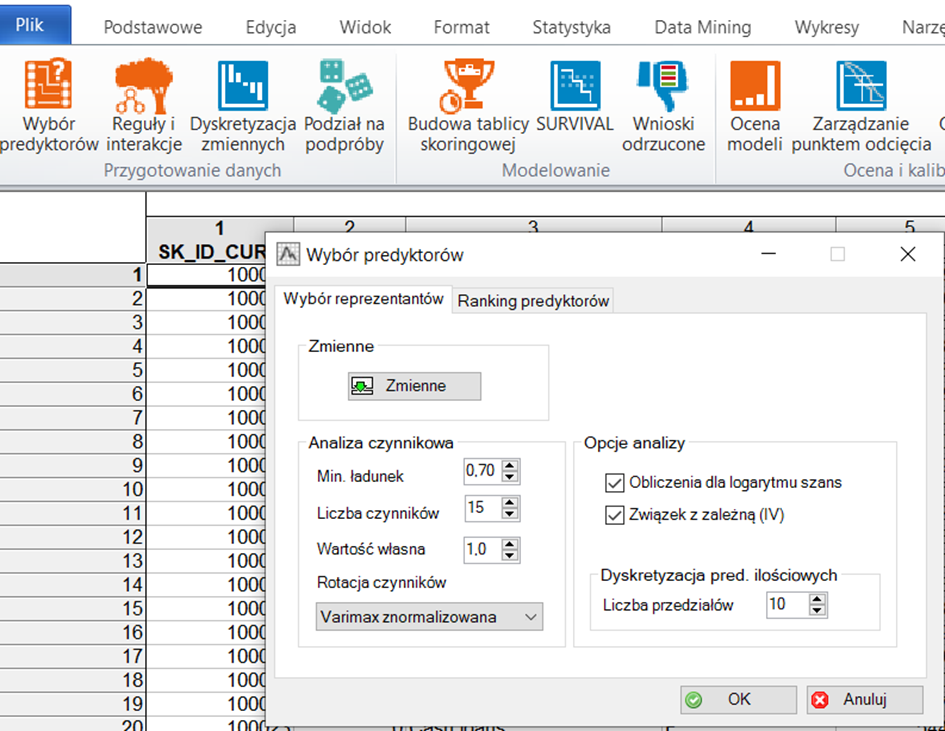

Min. ładunek określa kryterium przypisywania poszczególnych zmiennych do wiązek 
reprezentowanych przez uzyskane czynniki. Wartość oznacza minimalną wartość bezwzględną
ładunku (korelacji pomiędzy zmienną a czynnikiem), jaka kwalifikuje zmienną do wiązk Ustawiam na 0,7!.

Liczba czynników określa, jaka liczba czynników zostanie wyodrębniona. Opcja ta jest powiązana 
z opcją Wartość własna. Program wyodrębni taką liczbę czynników, jaka wynika z obydwóch 
kryteriów łącznie – liczba czynników będzie nie większa niż wartość parametru Liczba czynników 
natomiast wartość własna każdego z wyodrębnionych czynników będzie nie mniejsza niż wartoć 
parametru Wartość własna.

Obliczenia dla logarytmu szans transformuje predyktory na wartości WoE. Dzięki tej transformacji w analizie można wykorzystać zmienne 
jakościowe. Zmienne ilościowe przed transformacją zostaną podzielone na równoliczne kategori.e

Podobnie jak w przypadku wyboru predyktorów należy wybrać zmienne:

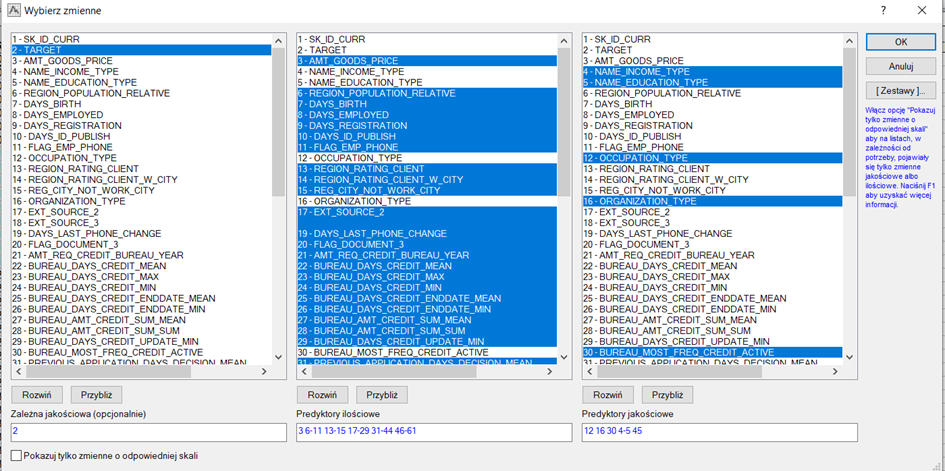

Po przeliczeniach otrzymujemy następującą tabelę:

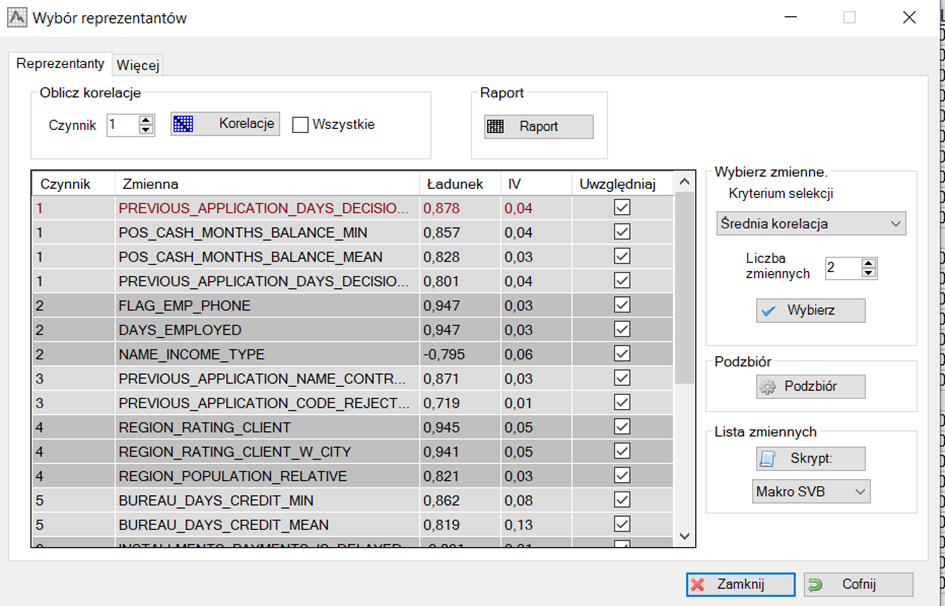

Wczytany zbiór danych z miarami poniżej

In [162]:
reprezentanci = pd.read_excel('wybor reprezentantow.xlsx', engine='openpyxl')

In [163]:
reprezentanci

,Czynnik,Zmienna,Ładunek,IV
0,1,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,0.92,0.04
1,1,POS_CASH_MONTHS_BALANCE_MIN,0.89,0.04
2,1,POS_CASH_MONTHS_BALANCE_MEAN,0.84,0.03
3,1,PREVIOUS_APPLICATION_DAYS_DECISION_MEAN,0.82,0.04
4,2,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,0.84,0.03
5,2,PREVIOUS_APPLICATION_NAME_PRODUCT_TYPE_WALK-IN,0.72,0.02
6,3,FLAG_EMP_PHONE,0.89,0.03
7,3,DAYS_EMPLOYED,0.89,0.03
8,4,REGION_RATING_CLIENT,0.95,0.05
9,4,REGION_RATING_CLIENT_W_CITY,0.95,0.05


W tym miejscu dodatkowo chciałbym sprawdzić, które zmienne mają największe korelacje między sobą. 
<br> Otóż usunięcie zmiennych z wysoką korelacją między sobą (nie między nimi a zmienną celu) jest ważne, ponieważ obecność skorelowanych zmiennych w modelu predykcyjnym może prowadzić do problemów z wieloliniowością, co z kolei osłabia interpretowalność modelu oraz może prowadzić do nadmiernego dopasowania. Redukcja takich zmiennych pomaga w poprawie stabilności i efektywności modelu, co jest kluczowe dla uzyskania wiarygodnych i generalizowalnych wyników predykcyjnych. W związku z tym decyduję się na usunięcie zmiennych, gdzie korelacja między nimi wynosi powyżej 0,9 - oczywiście z uwzględnieniem kontekstu biznesowego. Do usunięcia wybieram te zmienne, które mogą mieć: więcej braków danych, więcej wartości skrajnych, mniejsze znaczenie biznesowe i cięższą interpretacje.

In [164]:
#obliczenie korelacji między kolumnami numerycznymi
numeric_cols = df_train.select_dtypes(include=[np.number])
corr_matrix = numeric_cols.corr()

In [165]:
# Najwyższe korelacje między zmiennymi - taka informacja pomoże wyodrębnić kolumny do usunięcia 

high_corr_threshold = 0.9

# Znajdowanie par zmiennych o wysokiej korelacji i tworzenie ramki danych do prezentacji
high_corr_pairs = []
for i in corr_matrix.columns:
    for j in corr_matrix.index[corr_matrix.index > i]:  # Unikać duplikatów i porównywania ze sobą
        if abs(corr_matrix.at[i, j]) > high_corr_threshold:
            high_corr_pairs.append([i, j, corr_matrix.at[i, j]])

# Konwersja listy na DataFrame dla lepszej prezentacji
high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Zmienna 1', 'Zmienna 2', 'Correlation'])
high_corr_df

,Zmienna 1,Zmienna 2,Correlation
0,DAYS_EMPLOYED,FLAG_EMP_PHONE,-1.00
1,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,0.95
2,POS_CASH_MONTHS_BALANCE_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,0.93
3,POS_CASH_SK_DPD_MAX,POS_CASH_SK_DPD_MEAN,0.92
4,POS_CASH_SK_DPD_DEF_MAX,POS_CASH_SK_DPD_DEF_MEAN,0.98


In [166]:
columns_to_drop = [
    'POS_CASH_MONTHS_BALANCE_MIN', # czynnik 1, dodatkowo mocno skorelowana z PREVIOUS_APPLICATION_DAYS_DECISION_MIN
    'POS_CASH_MONTHS_BALANCE_MEAN', # czynnik 1 
    'PREVIOUS_APPLICATION_DAYS_DECISION_MEAN', # czynnik 1
    'PREVIOUS_APPLICATION_NAME_PRODUCT_TYPE_WALK-IN', # czynnik 2
    'FLAG_EMP_PHONE', # czynnik 3, bardzo mocno skorelowana z DAYS_EMPLOYED
    'REGION_RATING_CLIENT_W_CITY', # czynnik 4, zbyt duża korelacja z REGION_RATING_CLIENT
    'REGION_POPULATION_RELATIVE', # czynnik 4
    'POS_CASH_SK_DPD_DEF_MAX', # czynnik 5 IV =0
    'POS_CASH_SK_DPD_MAX',  # czynnik 5 IV =0
    'POS_CASH_SK_DPD_DEF_MEAN', # czynnik 5 IV =0
    'BUREAU_DAYS_CREDIT_MIN', # czynnik 6
    'INSTALLMENTS_PAYMENTS_IS_DELAYED_SUM', # czynnik 8
    'BUREAU_DAYS_CREDIT_ENDDATE_MIN', # czynnik 10
    'INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MEAN', # czynnik 15, beznadziejne IV 
    'INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_SUM' # czynnik 15
    ]                   

In [167]:
df_train.drop(columns=columns_to_drop, inplace=True)
df_test.drop(columns=columns_to_drop, inplace=True)
df_all.drop(columns=columns_to_drop, inplace=True)

In [168]:
len(columns_to_drop)

15

In [169]:
# Usunięcie kolumny SK_ID_CURR
columns_to_drop = ['SK_ID_CURR']        

In [170]:
df_train.drop(columns=columns_to_drop, inplace=True)
df_test.drop(columns=columns_to_drop, inplace=True)
df_all.drop(columns=columns_to_drop, inplace=True)

In [171]:
df_train.shape # pozostało 51 kolumn z czego 1 zmienna to target, czyli mamy 50 zmiennych objaśniających

(452394, 51)

In [172]:
df_test.shape

(61503, 51)

In [173]:
df_all.shape

(513897, 52)

## Analiza zmiennych

### Rozkład zmiennych ilościowych

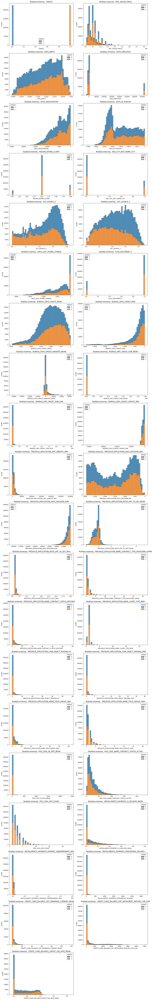

In [174]:
# Pobieranie numerycznych kolumn
numeric_columns = df_train.select_dtypes(include=[np.number]).columns

# Ilość kolumn w gridzie wykresów
num_cols = 2
num_rows = (len(numeric_columns) + 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Przejście przez wszystkie numeryczne kolumny w DataFrame
for i, column in enumerate(numeric_columns):
    row = i // num_cols
    col = i % num_cols
    sns.histplot(data=df_train, x=column, bins=50, hue=df_train['TARGET'], ax=axs[row, col], multiple="stack")
    axs[row, col].set_title(f'Rozkład zmiennej - {column}')
    axs[row, col].set_ylabel('Liczba')

# Jeżeli liczba subplotów jest nieparzysta, ukrywamy ostatni subplot, jeśli jest pusty
if len(numeric_columns) % num_cols != 0:
    axs[-1, -1].axis('off')

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-warning"> <b>Wnioski: </b> 
<br> * AMT_GOODS_PRICE -> Im przedmiot jest droższy, tym teoretycznie mniej złych klientów
<br> * DAYS_BIRTH -> Im młodsi klienci, tym proporcjonalnie więcej targetowych 1, czyli złych klientów
<br> * DAYS_EMPLOYED -> Zmienna powinna posiadać wyłącznie wartości ujemne, a istnieje bardzo duży odsetek obserwacji, które mają wartości kuriozalnie wysokie. Teoretycznie można byłoby przypisac im etykietę np. 'Nieznane', natoamiast nie ma to większego sensu, ponieważ przy wniosku aplikacyjnym, z którego to ta zmienna pochodzi, musi być podana ta informacja. Decyduję się na usunięcie tej zmiennej ze zbioru.
<br> * EXT_SOURCE_2, EXT_SOURCE_3 -> Widać bardzo wyraźnie, że im mniejszy rating ma dany wnioskowdawca ze źródła zewnętrzengo tym większe prawdopodobieństwo, że okaże się złym klientem. Obie zmienne wyglądają na bardzo dobrze różnicujące złych i dobrych klientów.
<br> * DAYS_LAST_PHONE_CHANGE -> Można zauważyć, że osoby które niedawno zmieniały telefon częsciej są złymi klientami. Z biznesowego punktu widzenia ma to sens.
<br> * BUREAU_DAYS_CREDIT_MEAN oraz BUREAU_DAYS_CREDIT_MAX -> Zmienna ta mówi o tym, ile dni przed bieżącym złożeniem wniosku klient złożył wniosek o kredyt w BIK. Im świeższy wniosek od tej sytuacji, tym teoretycznie gorsi klienci. 
<br> * PREVIOUS_APPLICATION_DAY_DECISION_MEAN oraz ...SUM -> zmienna ta mówi jak dawno temu była podjęta decyzja o poprzednim kredycie. Okazuje się, że im krócej tym gorsi klienci
<br> 
<br> W przypadku pozostałych zmiennych ciężko jest doszukać się konkretnych zależności, pokazujących co charakteryzuje złych, a co dobrych klientów.

In [175]:
# Usunięcie zmiennej DAYS_EMPLOYED
columns_to_drop = ['DAYS_EMPLOYED']

df_train = df_train.drop(columns=columns_to_drop)
df_test = df_test.drop(columns=columns_to_drop)
df_all = df_all.drop(columns=columns_to_drop)

In [176]:
df_train.shape

(452394, 50)

In [177]:
df_test.shape

(61503, 50)

In [178]:
df_all.shape

(513897, 51)

### Korelacje między zmiennymi ilościowymi

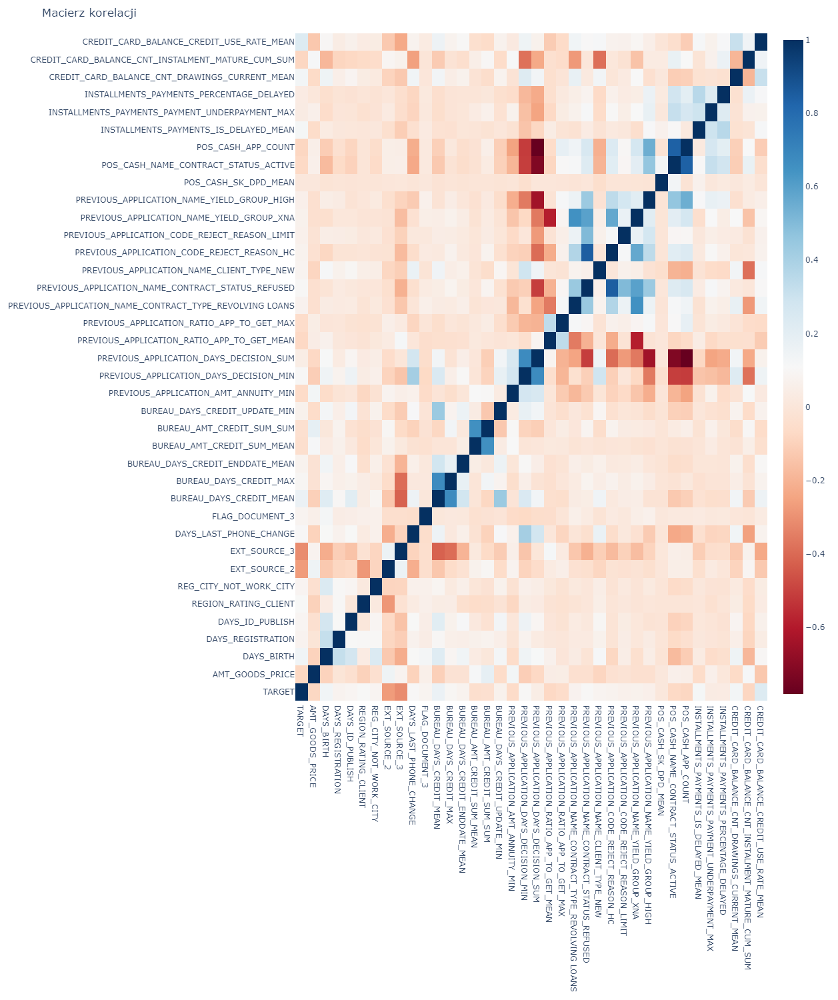

In [179]:
import plotly.graph_objects as go

numeric_df = df_train.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
labels = correlation_matrix.columns.tolist()

text = correlation_matrix.round(2).astype(str).values

# Stworzenie macierzy korelacji
fig = go.Figure(data=go.Heatmap(
                   z=correlation_matrix,
                   x=labels,
                   y=labels,
                   text=text,
                   hoverinfo="text",
                   colorscale='RdBu'))

# Dodanie tytułu i ustawienie rozmiaru
fig.update_layout(
    title='Macierz korelacji',
    autosize=False,
    width=1200,
    height=1500,
    margin=dict(t=50, b=50, l=50, r=50)
)

fig.show()

#### Najwyższe korelacje między zmiennymi

In [180]:
high_corr_threshold = 0.5

# Znajdowanie par zmiennych o wysokiej korelacji i tworzenie ramki danych do prezentacji
high_corr_pairs = []
for i in correlation_matrix.columns:
    for j in correlation_matrix.index[correlation_matrix.index > i]:  # Unikać duplikatów i porównywania ze sobą
        if abs(correlation_matrix.at[i, j]) > high_corr_threshold:
            high_corr_pairs.append([i, j, correlation_matrix.at[i, j]])

# Konwersja listy na DataFrame dla lepszej prezentacji
high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Zmienna 1', 'Zmienna 2', 'Correlation'])
# Sortowanie według wartości bezwzględnej korelacji
high_corr_df['Abs Correlation'] = high_corr_df['Correlation'].abs()
high_corr_df = high_corr_df.sort_values(by='Abs Correlation', ascending=False).drop('Abs Correlation', axis=1)

high_corr_df

,Zmienna 1,Zmienna 2,Correlation
7,PREVIOUS_APPLICATION_CODE_REJECT_REASON_HC,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,0.85
16,POS_CASH_APP_COUNT,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE,0.84
14,POS_CASH_APP_COUNT,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,-0.78
12,POS_CASH_NAME_CONTRACT_STATUS_ACTIVE,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,-0.72
2,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,0.68
0,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_MEAN,0.67
1,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,0.66
5,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_XNA,0.65
4,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_HIGH,-0.64
6,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_XNA,0.59


In [181]:
# Usunięcie zmiennych z najwyższymi korelacjami
columns_to_drop = ['PREVIOUS_APPLICATION_CODE_REJECT_REASON_HC', 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE' ] # ...HC miało gorsze IV od REFUSED, ...ACTIVE nieznacznie gorsze od APPCOUNT

df_train = df_train.drop(columns=columns_to_drop)
df_test = df_test.drop(columns=columns_to_drop)
df_all = df_all.drop(columns=columns_to_drop)

In [182]:
df_train.shape

(452394, 48)

In [183]:
df_test.shape

(61503, 48)

In [184]:
df_all.shape

(513897, 49)

### Rozkład zmiennych jakościowych

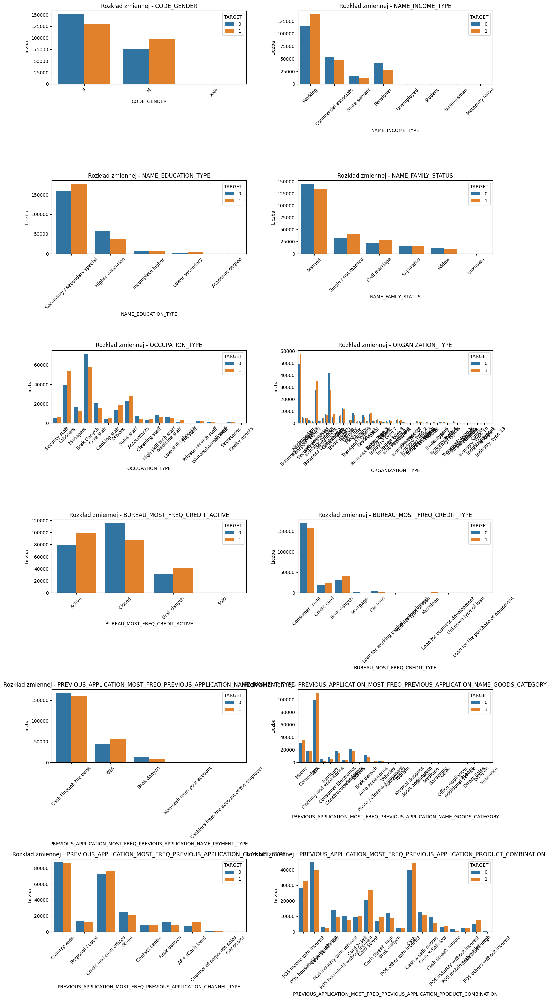

In [185]:
# Pobieranie kategorycznych kolumn
categorical_columns = df_train.select_dtypes(exclude=[np.number]).columns


df_train['TARGET'] = df_train['TARGET'].astype(str)

# Ilość kolumn w gridzie wykresów
num_cols = 2
num_rows = (len(categorical_columns) + 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Przejście przez wszystkie kategoryczne kolumny w DataFrame
for i, column in enumerate(categorical_columns):
    row = i // num_cols
    col = i % num_cols
    sns.countplot(data=df_train, x=column, hue=df_train['TARGET'], ax=axs[row, col])
    axs[row, col].set_title(f'Rozkład zmiennej - {column}')
    axs[row, col].set_ylabel('Liczba')
    axs[row, col].tick_params(axis='x', rotation=45)  # Obrót etykiet, jeśli są zbyt długie

# Jeżeli liczba subplotów jest nieparzysta, ukrywamy ostatni subplot, jeśli jest pusty
if len(categorical_columns) % num_cols != 0:
    axs[-1, -1].axis('off')

plt.tight_layout()
plt.show()

In [186]:
# Usunięcie zmiennej CODE_GENDER, ponieważ oficjalnie dane dotyczące płci nie powinny być wykorzystane w modelu
columns_to_drop = ['CODE_GENDER']

df_train = df_train.drop(columns=columns_to_drop)
df_test = df_test.drop(columns=columns_to_drop)
df_all = df_all.drop(columns=columns_to_drop)

In [187]:
df_train.shape

(452394, 47)

In [188]:
df_test.shape

(61503, 47)

In [189]:
df_all.shape

(513897, 48)

## Wybór najlepszych zmiennych do modeli

Po wcześniejszych analizach, pozostało 46 zmiennych objaśniających. Wciąż jest to za dużo i teraz spróbuję wybrać tylko około 20 najlepszych zmiennych, które będą brane do ostatecznych modeli scoringowych

### Random Forest Importance

Feature Importance to technika służąca do oceny, które zmienne w zestawie danych mają największy wpływ na przewidywany wynik. Algorytmy oparte na drzewach decyzyjnych, takie jak Random Forest czy Gradient Boosting Machines (GBM), są szczególnie przydatne, ponieważ oceniają ważność cechy podczas konstruowania drzew, analizując, jak poszczególne cechy wpływają na czystość węzłów.

Lasy losowe to jeden z najpopularniejszych algorytmów uczenia maszynowego. Są bardzo skuteczne, ponieważ zapewniają ogólnie dobrą wydajność predykcyjną, niski overfitting i łatwą interpretację istotności zmiennych. Innymi słowy, łatwo jest obliczyć, w jakim stopniu każda zmienna przyczynia się do podjęcia decyzji.

Lasy losowe składają się z dziesiątek, setek lub tysięcy drzew decyzyjnych, z których każde zbudowane jest na podstawie losowego wyboru obserwacji ze zbioru danych i losowej ilości zmiennych. Żadne drzewo nie widzi wszystkich danych i cech, co gwarantuje, że drzewa są mniej podatne na nadmierne dopasowanie.

Każde drzewo jest również sekwencją pytań tak-nie opartych na jednej zmiennej, np. „czy klient zarabia mniej niż 5.000 pln?”. W każdym pytaniu (węźle drzewa) dzielą zbiór danych na 2 segmenty, z których każdy zawiera obserwacje, które są między sobą bardziej podobne i różnią się od tych z drugiego segmentu. W przypadku klasyfikacji miarą zanieczyszczenia jest zanieczyszczenie Giniego lub entropia. Dlatego podczas trenowania drzewa można obliczyć, o ile każda cecha zmniejsza zanieczyszczenie. Im bardziej dana cecha zmniejsza zanieczyszczenie, tym ważniejsza jest to cecha. W lasach losowych spadek zanieczyszczenia z każdej cechy można uśrednić między drzewami, aby określić ostateczne znaczenie zmiennej.

Mówiąc prościej, zmienne wybrane na wierzchołkach drzew są ogólnie ważniejsze niż cechy wybrane na końcowych węzłach drzew. Dzieje się tak, ponieważ górne podziały prowadzą do większego przyrostu informacji.

#### Przygotowanie danych

##### Obsługa brakujących wartości dla zmiennych ilościowych

Większość algorytmów wymaga obsługi braków danych. Nam zależy na tym, żeby jednak informacja o brakach danych pozostała, bo może nieść ze sobą cenne informacje, a potem w procesie dyskretyzacji wyodrębnimy w ten sposób osobne grupy klientów. W związku z tym, dla zmiennych ilościowych spróbuję znaleźć unikatową liczbę, która będzie symbolizować braki danych (-99999).

In [190]:
# Lista zbiorów danych do analizy
datasets = [df_train, df_test, df_all]
dataset_names = ['df_train', 'df_test', 'df_all']

# Przechowywanie informacji czy znaleziono jakieś kolumny z -99999
found_minus_99999 = False

# Przejście przez każdy zbiór danych
for dataset, name in zip(datasets, dataset_names):
    numerical_columns = dataset.select_dtypes(include=[np.number]).columns

    print(f"Liczba wystąpień wartości -99999 w kolumnach numerycznych dla {name} (tylko gdy > 0):")
    local_found = False

    # Wypisanie liczby wystąpień wartości -99999 tylko dla kolumn, gdzie jest więcej niż 0 takich wartości
    for column in numerical_columns:
        count_minus_99999 = dataset[column].value_counts().get(-99999, 0)
        if count_minus_99999 > 0:
            print(f"{column}: {count_minus_99999}")
            found_minus_99999 = True
            local_found = True

    # Informacja o braku wystąpień -99999 w danym zbiorze
    if not local_found:
        print(f"Brak kolumn z wartością -99999 w {name}.")

Liczba wystąpień wartości -99999 w kolumnach numerycznych dla df_train (tylko gdy > 0):
Brak kolumn z wartością -99999 w df_train.
Liczba wystąpień wartości -99999 w kolumnach numerycznych dla df_test (tylko gdy > 0):
Brak kolumn z wartością -99999 w df_test.
Liczba wystąpień wartości -99999 w kolumnach numerycznych dla df_all (tylko gdy > 0):
Brak kolumn z wartością -99999 w df_all.


Można zatem przyjąć liczbę -99999 jako brak danych dla zmiennych ilościowych

In [191]:
for dataset in datasets:
    numerical_columns = dataset.select_dtypes(include=[np.number]).columns
    dataset[numerical_columns] = dataset[numerical_columns].fillna(-99999)

In [192]:
df_train.isnull().any().any()

False

In [193]:
df_test.isnull().any().any()

False

In [194]:
df_all.isnull().any().any()

False

##### Podział zbiorów na x i y

In [195]:
df_train.head(1)

,TARGET,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,REGION_RATING_CLIENT,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,BUREAU_DAYS_CREDIT_UPDATE_MIN,BUREAU_MOST_FREQ_CREDIT_ACTIVE,BUREAU_MOST_FREQ_CREDIT_TYPE,PREVIOUS_APPLICATION_AMT_ANNUITY_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MEAN,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MAX,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,PREVIOUS_APPLICATION_NAME_CLIENT_TYPE_NEW,PREVIOUS_APPLICATION_CODE_REJECT_REASON_LIMIT,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_XNA,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_HIGH,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_PAYMENT_TYPE,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_GOODS_CATEGORY,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_CHANNEL_TYPE,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_PRODUCT_COMBINATION,POS_CASH_SK_DPD_MEAN,POS_CASH_APP_COUNT,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MAX,INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED,CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT_MEAN,CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM_SUM,CREDIT_CARD_BALANCE_CREDIT_USE_RATE_MEAN
0,0,112500.00,Working,Secondary / secondary special,Married,-14669,-6152.00,-4731,Security staff,2,0,Business Entity Type 3,0.18,0.68,-228,1,-1317.00,-151.00,325.33,395797.50,2374785.00,-518.00,Active,Consumer credit,5099.58,-2657.00,-3698.00,1.06,1.25,0.00,0.00,1.00,0.00,0.00,0.00,Cash through the bank,Mobile,Country-wide,POS mobile with interest,0.00,3.00,0.04,0.00,10.00,-99999.00,-99999.00,-99999.00


In [196]:
df_train.shape

(452394, 47)

In [197]:
# Podział danych na zmienną celu (y) jako pierwszą kolumnę i cechy (X) jako pozostałe kolumny
X_train = df_train.iloc[:, 1:]  # Wyklucza pierwszą kolumnę
y_train = df_train.iloc[:, 0]   # Pierwsza kolumna jako zmienna zależna
X_test = df_test.iloc[:, 1:]    # Wyklucza pierwszą kolumnę
y_test = df_test.iloc[:, 0]     # Pierwsza kolumna jako zmienna zależna

In [198]:
X_train.shape

(452394, 46)

In [199]:
X_train.head(5)

,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,REGION_RATING_CLIENT,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_AMT_CREDIT_SUM_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,BUREAU_DAYS_CREDIT_UPDATE_MIN,BUREAU_MOST_FREQ_CREDIT_ACTIVE,BUREAU_MOST_FREQ_CREDIT_TYPE,PREVIOUS_APPLICATION_AMT_ANNUITY_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_DAYS_DECISION_SUM,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MEAN,PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MAX,PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,PREVIOUS_APPLICATION_NAME_CLIENT_TYPE_NEW,PREVIOUS_APPLICATION_CODE_REJECT_REASON_LIMIT,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_XNA,PREVIOUS_APPLICATION_NAME_YIELD_GROUP_HIGH,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_PAYMENT_TYPE,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_GOODS_CATEGORY,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_CHANNEL_TYPE,PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_PRODUCT_COMBINATION,POS_CASH_SK_DPD_MEAN,POS_CASH_APP_COUNT,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MAX,INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED,CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT_MEAN,CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM_SUM,CREDIT_CARD_BALANCE_CREDIT_USE_RATE_MEAN
0,112500.00,Working,Secondary / secondary special,Married,-14669,-6152.00,-4731,Security staff,2,0,Business Entity Type 3,0.18,0.68,-228,1,-1317.00,-151.00,325.33,395797.50,2374785.00,-518.00,Active,Consumer credit,5099.58,-2657.00,-3698.00,1.06,1.25,0.00,0.00,1.00,0.00,0.00,0.00,Cash through the bank,Mobile,Country-wide,POS mobile with interest,0.00,3.00,0.04,0.00,10.00,-99999.00,-99999.00,-99999.00
1,76500.00,Working,Higher education,Married,-17875,-8753.00,-1427,Laborers,2,0,Kindergarten,0.38,0.83,-2028,1,-2914.00,-2914.00,-2549.00,45000.00,45000.00,-2546.00,Closed,Consumer credit,8729.55,-708.00,-708.00,0.85,0.85,0.00,0.00,1.00,0.00,0.00,0.00,Cash through the bank,Computers,Regional / Local,POS household with interest,0.00,1.00,0.00,0.00,0.00,-99999.00,-99999.00,-99999.00
2,675000.00,Commercial associate,Higher education,Married,-10648,-1208.00,-980,Managers,3,0,Transport: type 4,0.54,0.77,-574,1,-1110.00,-566.00,816.75,1472400.00,7362000.00,-485.00,Closed,Consumer credit,24996.96,-574.00,-574.00,0.86,0.86,0.00,0.00,1.00,0.00,0.00,0.00,XNA,XNA,Credit and cash offices,Cash Street: low,0.00,1.00,0.00,0.00,0.00,-99999.00,-99999.00,-99999.00
3,405000.00,Commercial associate,Secondary / secondary special,Single / not married,-19244,-8562.00,-1574,Brak Danych,2,0,Housing,0.23,-99999.00,0,0,-953.50,-506.00,173.50,88823.25,355293.00,-1124.00,Active,Credit card,30667.32,-236.00,-236.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,Cash through the bank,Clothing and Accessories,Stone,POS industry with interest,0.00,1.00,0.00,0.00,0.00,-99999.00,-99999.00,-99999.00
4,675000.00,Commercial associate,Secondary / secondary special,Married,-20437,-12796.00,-1119,Managers,1,0,Business Entity Type 3,0.60,0.41,-257,0,-257.00,-257.00,111.00,514003.50,514003.50,-2.00,Active,Consumer credit,53148.42,-257.00,-514.00,1.00,1.00,0.00,1.00,2.00,0.00,0.00,0.00,Cash through the bank,Furniture,Country-wide,POS industry with interest,0.00,1.00,0.00,0.00,0.00,-99999.00,-99999.00,-99999.00


In [200]:
y_train.shape

(452394,)

In [201]:
y_train.head(1)

0    0
Name: TARGET, dtype: object

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> Warto wspomnieć, że model uczenia maszynowego w bibliotece sklearn wymaga, aby wszystkie cechy wejściowe były w formacie numerycznym. W związku z tym, nie będę zamieniał moich zmiennych kategorycznych, tylko po prostu przeprowadzę feature selection tylko dla zmiennych numerycznych, ponieważ jest ich zdecydowanie więcej.
<br>
<br> Co do zmiennych kategorycznych to jest ich obecnie 11 i o ich redukcji zdecyduję na etapie dyskretyzacji zmiennych. Chciałbym, żeby pozostało z nich około 5 zmiennych.

In [202]:
# Wybieranie kolumn numerycznych
X_train_numeric = X_train.select_dtypes(include=['int64', 'float64'])
X_test_numeric = X_test.select_dtypes(include=['int64', 'float64'])

#### Trenowanie modelu i ocena ważności cech

In [203]:
from sklearn import preprocessing, ensemble
import plotly.graph_objects as go
import plotly.offline as py

In [204]:
from sklearn.ensemble import RandomForestClassifier

# Tworzenie i trenowanie modelu RandomForest tylko na numerycznych danych
model_numeric = RandomForestClassifier(n_estimators=1000, max_depth=10) # Liczba drzew ustawiona na 1000 (wynik jest średnią drzew)
model_numeric.fit(X_train_numeric, y_train)

# Pobranie ważności cech
importances_numeric = model_numeric.feature_importances_

# Tworzenie DataFrame z ważnościami cech numerycznych
df_numeric_importance = pd.concat([
    pd.DataFrame(X_train_numeric.columns, columns=['feat']),
    pd.DataFrame(importances_numeric, columns=['importance'])
], axis=1).sort_values(by='importance', ascending=False)

In [205]:
# Wyświetlenie ważności zmiennych
print(df_numeric_importance)

                                                       feat  importance
6                                              EXT_SOURCE_2        0.22
7                                              EXT_SOURCE_3        0.20
1                                                DAYS_BIRTH        0.05
10                                  BUREAU_DAYS_CREDIT_MEAN        0.04
29                    INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN        0.04
34                 CREDIT_CARD_BALANCE_CREDIT_USE_RATE_MEAN        0.03
8                                    DAYS_LAST_PHONE_CHANGE        0.03
0                                           AMT_GOODS_PRICE        0.03
17                   PREVIOUS_APPLICATION_DAYS_DECISION_MIN        0.03
11                                   BUREAU_DAYS_CREDIT_MAX        0.03
32            CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT_MEAN        0.02
22        PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED        0.02
31                 INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED     

Wyniki są bardzo sensowne i wydają się odzworowywać rzeczywistą moc predykcyjną modeli. Zdecydowałem o pozostawieniu tylko zmiennych z TOP20 pod względem miary Importance oraz wybranych ekspercko dodatkowo 4 zmiennych:'DAYS_REGISTRATION', 'POS_CASH_APP_COUNT', 'REGION_RATING_CLIENT', 'FLAG_DOCUMENT_3'.

In [208]:
# Pozostawienie tylko 20 najelepszych i 4 wybranych koliumn, czyli usuniecie pozostałych
cols_with_low_importance = df_numeric_importance[~df_numeric_importance['feat'].isin(['DAYS_REGISTRATION', 'POS_CASH_APP_COUNT', 'REGION_RATING_CLIENT', 'FLAG_DOCUMENT_3'])].sort_values(by='importance', ascending=False)['feat'].iloc[20:].tolist()

# Wydrukuj listę kolumn
print(cols_with_low_importance)

['BUREAU_DAYS_CREDIT_UPDATE_MIN', 'INSTALLMENTS_PAYMENTS_PAYMENT_UNDERPAYMENT_MAX', 'PREVIOUS_APPLICATION_AMT_ANNUITY_MIN', 'CREDIT_CARD_BALANCE_CNT_INSTALMENT_MATURE_CUM_SUM', 'POS_CASH_SK_DPD_MEAN', 'PREVIOUS_APPLICATION_NAME_YIELD_GROUP_HIGH', 'PREVIOUS_APPLICATION_NAME_CLIENT_TYPE_NEW', 'REG_CITY_NOT_WORK_CITY', 'PREVIOUS_APPLICATION_NAME_YIELD_GROUP_XNA', 'PREVIOUS_APPLICATION_NAME_CONTRACT_TYPE_REVOLVING LOANS', 'PREVIOUS_APPLICATION_CODE_REJECT_REASON_LIMIT']


In [209]:
# Usuwam te zmienne ze wszystkich 3 zbiorów

df_train = df_train.drop(columns=cols_with_low_importance)
df_test = df_test.drop(columns=cols_with_low_importance)
df_all = df_all.drop(columns=cols_with_low_importance)

In [210]:
df_train.shape

(452394, 36)

In [211]:
df_test.shape

(61503, 36)

In [212]:
df_all.shape

(513897, 37)

<div class="alert alert-block alert-warning"> <b>Info: </b> 
<br> Pozostało 35 zmiennych objaśniających, z czego 11 to zmienne jakościowe, które zostaną jeszcze dokładnie sprawdzone i wyselekcjonowane podczas dyskretyzacji.

## Dyskretyzacja zmiennych

In [213]:
# Zrzucenie zbioru do csv, żeby można było go załadować do programu Statistica
#df_train.to_csv('df_train3.csv', index=False)

NA TYM ETAPIE ODBYŁ SIĘ PROCES DYSKRETYZACJI ZMIENNYCH W PROGRAMIE STATISTICA

Zmienne ilościowe zostały pogrupowane w logiczne grupy, a jakościowe zaregowane do większych grup. 
Wszystko odbyło się zgodnie z dobrymi praktykami stosowanymi podczas tego procesu, czyli:
* w każdej klasie powinno być przynajmniej 5% obserwacji i 5% złych kredytów* wartości WoE powinny się wyraźnie różnić pomiędzy atrybutam
* trend obserwowany w wartościach WoE powinien zgadzać się z wiedzą biznesową.

Podczas dyskretyzacji bardzo ważne jest, żeby redukując liczbę przedziałów spróbować utrzymać stosunkowo jak najwyższe wartości IV

In [214]:
# Zmienne które podczas dyskretyzacji w Statistice zdecydowałem się usunąć całkowicie ze zbioru
columns_to_drop = [
    'PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MAX', # niezrozumiałe wyniki zmiennej, usuwam
    'CREDIT_CARD_BALANCE_CNT_DRAWINGS_CURRENT_MEAN', # brak stanowi zdecydowaną większość, ale nie rozróżnia dobrze złych i dobrych klientów
    'CREDIT_CARD_BALANCE_CREDIT_USE_RATE_MEAN', # powód jak wyżej
    'BUREAU_AMT_CREDIT_SUM_SUM', # słabe rozróznienie
    'BUREAU_AMT_CREDIT_SUM_MEAN',  # słabe rozróznienie
    'PREVIOUS_APPLICATION_DAYS_DECISION_SUM', # niepotrzeba
    'PREVIOUS_APPLICATION_RATIO_APP_TO_GET_MEAN', # niezrozumiała zmienna
    'NAME_FAMILY_STATUS', # usuwam, niezrozumiała biznesowo
    'BUREAU_MOST_FREQ_CREDIT_TYPE', # usuwam, najczęstsze grupy słabo rozróżniają
    'PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_PAYMENT_TYPE', # sytuacja jak wyżej, usuwam
    'PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_CHANNEL_TYPE', # usuwam, najliczniejsze grupy nie rozróżniają zbyt dobrze
    'PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_PRODUCT_COMBINATION',
    'PREVIOUS_APPLICATION_MOST_FREQ_PREVIOUS_APPLICATION_NAME_GOODS_CATEGORY',
    'BUREAU_MOST_FREQ_CREDIT_ACTIVE'
    ]   

In [215]:
# Usuwam te zmienne ze wszystkich 3 zbiorów

df_train = df_train.drop(columns=columns_to_drop)
df_test = df_test.drop(columns=columns_to_drop)
df_all = df_all.drop(columns=columns_to_drop)

In [216]:
df_train.shape

(452394, 22)

In [217]:
df_test.shape

(61503, 22)

In [218]:
df_all.shape

(513897, 23)

Pozostało 21 zmiennych objaśniających. Jest to odpowiednia liczba do tworzenia modeli scoringowych, ponieważ poza jak najlepszą dokładnością, muszą być również interpretowalne i rozumiane pod kątem biznesowym. 

In [219]:
#df_train.to_csv('df_train.csv', index=False)

In [220]:
#df_test.to_csv('df_test.csv', index=False)

In [221]:
#df_all.to_csv('df_all.csv', index=False)

In [222]:
df_train.head()

,TARGET,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,REGION_RATING_CLIENT,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,PREVIOUS_APPLICATION_DAYS_DECISION_MIN,PREVIOUS_APPLICATION_NAME_CONTRACT_STATUS_REFUSED,POS_CASH_APP_COUNT,INSTALLMENTS_PAYMENTS_IS_DELAYED_MEAN,INSTALLMENTS_PAYMENTS_PERCENTAGE_DELAYED
0,0,112500.00,Working,Secondary / secondary special,-14669,-6152.00,-4731,Security staff,2,Business Entity Type 3,0.18,0.68,-228,1,-1317.00,-151.00,325.33,-2657.00,0.00,3.00,0.04,10.00
1,0,76500.00,Working,Higher education,-17875,-8753.00,-1427,Laborers,2,Kindergarten,0.38,0.83,-2028,1,-2914.00,-2914.00,-2549.00,-708.00,0.00,1.00,0.00,0.00
2,0,675000.00,Commercial associate,Higher education,-10648,-1208.00,-980,Managers,3,Transport: type 4,0.54,0.77,-574,1,-1110.00,-566.00,816.75,-574.00,0.00,1.00,0.00,0.00
3,0,405000.00,Commercial associate,Secondary / secondary special,-19244,-8562.00,-1574,Brak Danych,2,Housing,0.23,-99999.00,0,0,-953.50,-506.00,173.50,-236.00,0.00,1.00,0.00,0.00
4,0,675000.00,Commercial associate,Secondary / secondary special,-20437,-12796.00,-1119,Managers,1,Business Entity Type 3,0.60,0.41,-257,0,-257.00,-257.00,111.00,-257.00,1.00,1.00,0.00,0.00
